# Proof of Concept

## Problem
We're trying to understand the network of historical painters, analyzing how individuals were connected (by geographical and temporal proximity, by shared styles, by co-exhibition up to even the current day, and by explicitly noted teacher-student, friend, coworker, and influence relationships).

## Approach & Preliminary Results
We begin by visualizing, via century bins, the network that is produced via linking of painters by each of the strategies we are interested in (geographic and temporal proximity, shared styles, co-exhibition, and explictly noted relationships). These visualizations are the preliminary results we include within this notebook. To expand upon these results, we will conduct comparisons within a sort of matrix (century bins X type of linking). From the observations of this analysis, we hope to formulate a detailed, compelling question that will continue to drive our project forwards.

In [274]:
%pip install seaborn
%pip install networkx pydot
%pip install mplcursors

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [275]:
import pandas as pd
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import mplcursors
import seaborn as sns
import numpy as np
import ast
from itertools import combinations
from collections import Counter
import re
from IPython.display import Image, display
from matplotlib.lines import Line2D

In [276]:
url = "https://raw.githubusercontent.com/me9hanics/PainterPalette/main/datasets/artists.csv"
artists = pd.read_csv(url)

In [277]:
artists.head()

,artist,Nationality,citizenship,gender,styles,movement,Art500k_Movements,birth_place,death_place,birth_year,...,PaintingsExhibitedAt,PaintingsExhibitedAtCount,PaintingSchool,Influencedby,Influencedon,Pupils,Teachers,FriendsandCoworkers,Contemporary,Type
0,Bracha L. Ettinger,"French,Jewish,Israeli",Israel,female,New European Painting,New European Painting,{New European Painting:21},Tel Aviv,NaN,1948.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,NaN
1,William H. Johnson,American,United States,male,"Cubism, Expressionism, Futurism, Naïve Art (Pr...",Harlem Renaissance (New Negro Movement),{Harlem Renaissance (New Negro Movement):102},Florence,Central Islip,1901.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN
2,Alexey Bogolyubov,Russian,NaN,NaN,"Realism, Romanticism",Romanticism,"{Romanticism,Realism:44}",NaN,NaN,NaN,...,"Saint Petersburg, Rybinsk, Russia, Moscow","{Rybinsk:2},{Russia:9},{Saint Petersburg:6},{M...",Peredvizhniki (Society for Traveling Art Exhib...,NaN,NaN,NaN,NaN,NaN,No,NaN
3,O. Louis Guglielmi,"American,Egyptian",United States,male,"Cubism, Expressionism, Magic Realism",Social Realism,"{Social Realism,Magic Realism:34}",Cairo,Amagansett,1906.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN
4,Mikalojus Konstantinas Ciurlionis,Lithuanian,Russian Empire,male,Symbolism,Symbolism,"{Art Nouveau:1},{Symbolism:169}",Varėna,Warsaw,1875.0,...,"Kaunas, Lithuania","{Kaunas:7},{Lithuania:7}",NaN,"allegories-and-symbols,boats-and-ships,",NaN,"The cycle of 5 paintings Deluge,",NaN,"Artists2/Mikalojus Ciurlionis/Wrath Ii 1904.jpg,",No,NaN


In [278]:
artists.shape

(10361, 30)

In [279]:
artists = artists.dropna(subset=['birth_year'])
print(artists.shape)

(9456, 30)


In [280]:
# split the artists into the century block that they belong
artists_14c = artists[(artists['birth_year'] >= 1300) & (artists['birth_year'] < 1400)]
artists_15c = artists[(artists['birth_year'] >= 1400) & (artists['birth_year'] < 1500)]
artists_16c = artists[(artists['birth_year'] >= 1500) & (artists['birth_year'] < 1600)]
artists_17c = artists[(artists['birth_year'] >= 1600) & (artists['birth_year'] < 1700)]
artists_18c = artists[(artists['birth_year'] >= 1700) & (artists['birth_year'] < 1800)]
artists_19c = artists[(artists['birth_year'] >= 1800) & (artists['birth_year'] < 1900)]
artists_20c = artists[(artists['birth_year'] >= 1900) & (artists['birth_year'] < 2100)] # also includes 21st-century artists since they are so sparse

In [281]:
print(artists_14c.shape)
print(artists_15c.shape)
print(artists_16c.shape)
print(artists_17c.shape)
print(artists_18c.shape)
print(artists_19c.shape)
print(artists_20c.shape)

(65, 30)
(289, 30)
(526, 30)
(759, 30)
(1124, 30)
(3170, 30)
(3418, 30)


In [282]:
# to do: save a spring layout for each century; figure out how to display nicely with labels

In [283]:
# for each century block, create a visualization based on geographic proximity
# potential future: color edges based on location (try later w/ weighting to prioritize which shared location is used for coloring); consider years of the geographical proximity; weight the edges based on # of common years
def unweighted_geo_proximity(artists):
  G = nx.Graph()
  artists = artists[["artist", "locations"]]
  artists = artists.dropna()
  G.add_nodes_from(artists["artist"])

  locs_to_artists = dict()
  for index, row in artists.iterrows():
    for location in row["locations"].split(","):
      if location in locs_to_artists:
        locs_to_artists[location].append(row["artist"])
      else:
        locs_to_artists[location] = [row["artist"]]

  for location in locs_to_artists:
    for artist1 in locs_to_artists[location]:
      for artist2 in locs_to_artists[location]:
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2, location=location)

  # Create colormap for locations
  locations = locs_to_artists.keys()
  cmap = plt.get_cmap('tab10')

  # Map each location to a color
  color_map = {loc: cmap(i % cmap.N) for i, loc in enumerate(locations)}

  # Convert locations to colors
  colors = [color_map[loc] for loc in locations]

  # Add color attribute to edges
  for u, v in G.edges():
    G[u][v]['color'] = color_map.get(G[u][v].get('location'), 'gray')

  return G

In [284]:
# format is a list of dictionaries {city, date_ranges: [{start_year, end_year}, {start_year, end_year}], ...}
def parse_locations(location_str):
    locations = ast.literal_eval(location_str)
    result = []
    for item in locations:
        location, years_part = item.split(':')
        ranges = years_part.split(',')
        date_ranges = []
        for r in ranges:
            start_year, end_year = r.split('-')
            date_ranges.append({
                'start_year': int(start_year),
                'end_year': int(end_year)
            })
        result.append({
            'location': location,
            'date_ranges': date_ranges
        })
    return result

In [285]:
# for each century block, create a visualization based on geographic proximity
# color edges based on location and weighting to prioritize which shared location is used for coloring); consider years of the geographical proximity; weight the edges based on # of common years
def geo_proximity(artists):
  G = nx.Graph()
  
  # drop NA values
  artists = artists[artists['locations_with_years'].notna() & (artists['locations_with_years'] != '[]')]
  artists = artists[["artist", "locations_with_years"]]
  artists = artists.dropna()

  artists['locations_parsed'] = artists['locations_with_years'].apply(parse_locations)

  G.add_nodes_from(artists["artist"])

  # flatten table
  rows = []
  for _, artist_row in artists.iterrows():
      for loc in artist_row['locations_parsed']:
          for date_range in loc['date_ranges']:
              rows.append({
                  'artist': artist_row['artist'],
                  'location': loc['location'],
                  'start_year': date_range['start_year'],
                  'end_year': date_range['end_year']
              })

  df_flat = pd.DataFrame(rows)

  edges = {}
  for location, group in df_flat.groupby('location'):
      artist_rows = list(group.itertuples())
      for a1, a2 in combinations(artist_rows, 2):
          # check if time ranges overlap
          overlap_start = max(a1.start_year, a2.start_year)
          overlap_end = min(a1.end_year, a2.end_year)
          artist1, artist2 = a1.artist, a2.artist
          if overlap_start <= overlap_end and artist1 != artist2:
              # add edges between 2 artists in alphabetical order of the artists
              if artist1 < artist2:
                if (artist1, artist2) in edges:
                  # edges keep weight and locations attributes, where locations keeps a dictionary of locations to weights/num overlapping years
                  edges[(artist1, artist2)]['weight'] += weight
                  edge_locations = edges[(artist1, artist2)]['locations']
                  if location in edge_locations:
                    edge_locations[location] += weight
                  else:
                    edge_locations[location] = weight
                else:
                  weight = overlap_end - overlap_start + 1
                  edges[(artist1, artist2)] = {'weight': weight, 'locations': {location: weight}}
              else: # a2 < a1
                if (artist2, artist1) in edges:
                  edges[(artist2, artist1)]['weight'] += weight
                  edge_locations = edges[(artist2, artist1)]['locations']
                  if location in edge_locations:
                    edge_locations[location] += weight
                  else:
                    edge_locations[location] = weight
                else:
                  weight = overlap_end - overlap_start + 1
                  edges[(artist2, artist1)] = {'weight': weight, 'locations': {location: weight}}
  
  loc_counts = {}

  for edge in edges:
    edge_locations = edges[edge]['locations']
    longest_location = max(edge_locations, key=edge_locations.get)
    edges[edge]['location'] = longest_location
    if longest_location in loc_counts:
      loc_counts[longest_location] += 1
    else:
      loc_counts[longest_location] = 1
  
  # add edges
  G.add_edges_from((u, v, attrs) for (u, v), attrs in edges.items())

  # Create colormap for locations
  locations = loc_counts.keys()
  cmap = plt.get_cmap('rainbow')

  # Map each location to a color
  color_map = {loc: cmap(i / len(locations)) for i, loc in enumerate(locations)}

  # Add color attribute to edges
  for u, v in G.edges():
    G[u][v]['color'] = color_map.get(G[u][v].get('location'), 'gray')

  # drop nodes without any edges
  isolated_nodes = list(nx.isolates(G))
  G.remove_nodes_from(isolated_nodes)

  return G

In [286]:
def visualize_geo_proximity(G, tag, labels=False):
  plt.rcParams['toolbar'] = 'toolbar2' # add zoom option
  fig, ax = plt.subplots(figsize=(10, 10))
  pos = nx.spring_layout(G, k=2.0, iterations=50, seed=42) # Use spring layout with increased 'k' for spacing
  edge_colors = [G[u][v]['color'] for u, v in G.edges()]
  top_10_colors = {color for color, _ in Counter(edge_colors).most_common(10)}
  color_map = {G[u][v]['location']: G[u][v]['color'] for u, v in G.edges()}
  legend_handles = [mpatches.Patch(color=color, label=loc) for loc, color in color_map.items() if color in top_10_colors]
  nx.draw_networkx(G, pos, edge_color=edge_colors, with_labels=labels, node_size=40, font_size=8)

  # make text more transparent
  for text in ax.texts:
      text.set_alpha(0.6)
  plt.legend(handles=legend_handles)
  plt.title('Geographic Proximity Network (' + tag + ' Artists)')
  plt.axis('off')

  # save before show
  fig.savefig('visualization.png', dpi=150, bbox_inches='tight')

  # display static version inline
  display(Image('visualization.png'))

  # then open interactive window
  plt.show()

In [287]:
def visualize_greedy_modularity_clusters_location(G, tag, labels=False):
  communities = greedy_modularity_communities(G, weight='weight')

  def dominant_location(G, nodes):
    locations = []
    for u, v in G.subgraph(community).edges():
        locations.append(G[u][v]['location'])
    return Counter(locations).most_common(1)[0][0]
  
  plt.rcParams['toolbar'] = 'toolbar2' # add zoom option
  fig, ax = plt.subplots(figsize=(10, 10))

  # build subgraph for each community
  community_map = {}
  for i, community in enumerate(communities):
      for node in community:
          community_map[node] = i

  C = nx.Graph()
  C.add_nodes_from(range(len(communities)))
  for u, v in G.edges():
      cu, cv = community_map[u], community_map[v]
      if cu != cv:
          if C.has_edge(cu, cv):
              C[cu][cv]['weight'] += 1
          else:
              C.add_edge(cu, cv, weight=1)

  community_pos = nx.spring_layout(C, k=4.0, iterations=100, seed=42)

  # lay out nodes within each community, then offset globally
  pos = {}
  for i, community in enumerate(communities):
      subgraph = G.subgraph(community)
      if len(community) == 1:
          node = list(community)[0]
          pos[node] = community_pos[i]
          continue

      sub_pos = nx.spring_layout(subgraph, k=1.5, iterations=50, seed=42)

      scale = max(0.05, min(1.5, len(community) / len(G.nodes()) * 2))

      # scale down and offset to community center
      for node, (x, y) in sub_pos.items():
          cx, cy = community_pos[i]
          pos[node] = (cx + x * scale, cy + y * scale)

  # pos = nx.spring_layout(G, k=2.0, iterations=50, seed=42)

  edge_colors = [G[u][v]['color'] for u, v in G.edges()]
  top_10_colors = {color for color, _ in Counter(edge_colors).most_common(10)}
  color_map = {G[u][v]['location']: G[u][v]['color'] for u, v in G.edges()}
  legend_handles = [mpatches.Patch(color=color, label=loc) for loc, color in color_map.items() if color in top_10_colors]
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors, alpha=0.4)
  nodes = nx.draw_networkx_nodes(G, pos, node_size=20)
  cursor = mplcursors.cursor(nodes, hover=True)

  @cursor.connect("add") # adding label on hover
  def on_add(sel):
    node = list(G.nodes())[sel.index]
    sel.annotation.set_text(node)

  if labels: # only label most connected nodes
    node_labels = {}
    for i, community in enumerate(communities):
        top_nodes = sorted(community, key=lambda n: G.degree(n), reverse=True)[:3]
        for node in top_nodes:
            node_labels[node] = node
    nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=8)

  # make text more transparent
  for text in ax.texts:
      text.set_alpha(0.6)

  # Draw a circle around each community
  for i, community in enumerate(communities):
    if len(community) < 2:
       continue
    
    location = dominant_location(G, community)
    color = color_map[location]
    
    community_pos = [pos[n] for n in community]
    x = [p[0] for p in community_pos]
    y = [p[1] for p in community_pos]
    cx, cy = sum(x) / len(x), sum(y) / len(y)
    radius = max(((px - cx)**2 + (py - cy)**2)**0.5 for px, py in community_pos) + 0.1
    circle = mpatches.Circle((cx, cy), radius, fill=False, linewidth=2, edgecolor=color)
    ax.add_patch(circle)

    ax.text(cx, cy + radius + 0.02, location,
        ha='center', va='bottom',
        fontsize=9, color=color,
        fontweight='bold')
  
  ax.autoscale()
  
  plt.legend(handles=legend_handles)
  plt.title('Geographic Proximity Network (' + tag + ' Artists)')
  plt.axis('off')

  # save before show
  fig.savefig('visualization.png', dpi=150, bbox_inches='tight')

  # display static version inline
  display(Image('visualization.png'))

# then open interactive window
  plt.show()

In [288]:
# visualize_geo_proximity(geo_proximity(artists_14c), "14th Century", True)

In [289]:
# visualize_geo_proximity(geo_proximity(artists_15c), "15th Century", True)

In [290]:
# geo_proximity_15c = geo_proximity(artists_15c)
# visualize_geo_proximity(geo_proximity_15c, "15th Century", True)

In [291]:
# visualize_greedy_modularity_clusters_location(geo_proximity_15c, "15th Century", True)

In [292]:
# geo_proximity_16c = geo_proximity(artists_16c)
# visualize_geo_proximity(geo_proximity_16c, "16th Century")

In [293]:
# visualize_greedy_modularity_clusters_location(geo_proximity_16c, "16th Century")

In [294]:
# geo_proximity_17c = geo_proximity(artists_17c)
# visualize_geo_proximity(geo_proximity_17c, "17th Century")

In [295]:
# visualize_greedy_modularity_clusters_location(geo_proximity_17c, "17th Century")

In [296]:
# geo_proximity_18c = geo_proximity(artists_18c)
# visualize_geo_proximity(geo_proximity_18c, "18th Century")

In [297]:
# visualize_greedy_modularity_clusters_location(geo_proximity_18c, "18th Century")

In [298]:
# geo_proximity_19c = geo_proximity(artists_19c)
# visualize_geo_proximity(geo_proximity_19c, "19th Century")

In [299]:
# visualize_greedy_modularity_clusters_location(geo_proximity_19c, "19th Century")

In [300]:
# geo_proximity_20c = geo_proximity(artists_20c)
# visualize_geo_proximity(geo_proximity_20c, "20th Century")

In [301]:
# visualize_greedy_modularity_clusters_location(geo_proximity_20c, "20th Century")

In [302]:
# for each century block, create a visualization based on shared style
print("Style Count: ", artists['styles'].count())
print(artists['styles'].value_counts())
print("Styles Extended Count: ", artists['styles_extended'].count())
print(artists['styles_extended'].value_counts())
print("Styles_Count Count: ", artists['StylesCount'].count())
print(artists['StylesCount'].value_counts())

Style Count:  2980
styles
Romanticism                                                                97
Baroque                                                                    80
Surrealism                                                                 59
Impressionism                                                              57
Realism                                                                    50
                                                                           ..
Art Nouveau (Modern), Orientalism                                           1
Art Nouveau (Modern), Byzantine, Japonism, Realism, Symbolism               1
Art Nouveau (Modern), Expressionism, Naïve Art (Primitivism), Symbolism     1
Art Nouveau (Modern), Regionalism, Romanticism, Symbolism, Unknown          1
 Neo-Dada,Dada, Renaissance, Surrealism                                     1
Name: count, Length: 1318, dtype: int64
Styles Extended Count:  2980
styles_extended
{Conceptual Art:10}            

In [303]:
# adding an edge if they share any style
# potential future: color edges based on shared style (try later w/ weighting to prioritize which shared style is used for coloring); weight the edges based on # of shared styles
def unweighted_style_share(artists):
  G = nx.Graph()
  artists = artists[["artist", "styles"]]
  artists = artists.dropna()
  G.add_nodes_from(artists["artist"])

  styles_to_artists = dict()
  for index, row in artists.iterrows():
    for style in row["styles"].split(","):
      if style != 'Unknown':
        if style in styles_to_artists:
          styles_to_artists[style].append(row["artist"])
        else:
          styles_to_artists[style] = [row["artist"]]

  for style in styles_to_artists:
    for artist1 in styles_to_artists[style]:
      for artist2 in styles_to_artists[style]:
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2)

  return G

In [304]:
def parse_styles(s):
  return {k: int(v) for k, v in re.findall(r'\{([^:]+):(\d+)\}', s)}

In [305]:
# color edges based on shared style (try later w/ weighting to prioritize which shared style is used for coloring); weight the edges based on # of shared styles
# using styles_extended to count
def style_share(artists):
  G = nx.Graph()
  artists = artists[["artist", "styles_extended"]]
  artists = artists.dropna()

  G.add_nodes_from(artists["artist"])

  artists['styles'] = artists['styles_extended'].apply(parse_styles)

  styles_to_artists = dict()
  for index, row in artists.iterrows():
    for style in row["styles"].keys():
      if style != 'Unknown':
        if style in styles_to_artists:
          styles_to_artists[style][row['artist']] = row['styles'][style]
        else:
          styles_to_artists[style] = {row["artist"]: row['styles'][style]}

  for style in styles_to_artists:
    artists = styles_to_artists[style].keys()
    for artist1 in artists:
      for artist2 in artists:
        style_overlap = min(styles_to_artists[style][artist1], styles_to_artists[style][artist2])
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2, weight=style_overlap, styles={style: style_overlap})
        elif G.has_edge(artist1, artist2): # increment weight and add style to dictionary
          G[artist1][artist2]['weight'] += style_overlap
          G[artist1][artist2]['styles'][style] = style_overlap
  
  style_counts = nx.get_edge_attributes(G, "styles")

  # set dominant style
  for edge in style_counts:
    edge_styles = style_counts[edge]
    largest_style = max(edge_styles, key=edge_styles.get)
    G[edge[0]][edge[1]]['style'] = largest_style

  # Create colormap for styles
  styles = set(nx.get_edge_attributes(G, 'style').values())
  cmap = plt.get_cmap('rainbow')

  # Map each style to a color
  color_map = {style: cmap(i / len(styles)) for i, style in enumerate(styles)}

  # Add color attribute to edges
  for u, v in G.edges():
    G[u][v]['color'] = color_map.get(G[u][v].get('style'), 'gray')

  return G

In [306]:
def visualize_style_sharing(G, tag, labels=False):
  plt.figure(figsize=(10, 10)) # Increase figure size for better visibility
  pos = nx.spring_layout(G, k=0.5, iterations=50) # Use spring layout with increased 'k' for spacing
  edge_colors = [G[u][v]['color'] for u, v in G.edges()]
  edge_styles = [G[u][v]['style'] for u, v in G.edges()]
  top_10_styles = {style for style, _ in Counter(edge_styles).most_common(10)}
  color_map = {G[u][v]['style']: G[u][v]['color'] for u, v in G.edges()}
  legend_handles = [mpatches.Patch(color=color, label=style) for style, color in color_map.items() if style in top_10_styles]
  nx.draw_networkx(G, pos, edge_color=edge_colors, with_labels=labels, node_size=40, font_size=8)

  # make text more transparent
  ax = plt.gca()
  for text in ax.texts:
      text.set_alpha(0.6)
  plt.legend(handles=legend_handles)
  plt.title('Shared Styles Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

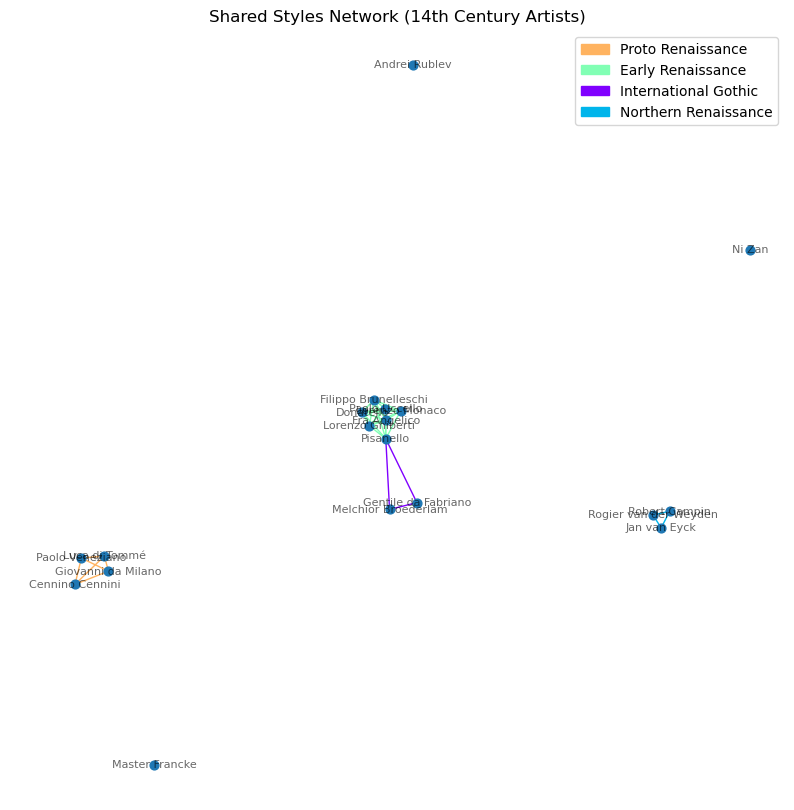

In [307]:
visualize_style_sharing(style_share(artists_14c), "14th Century", True)

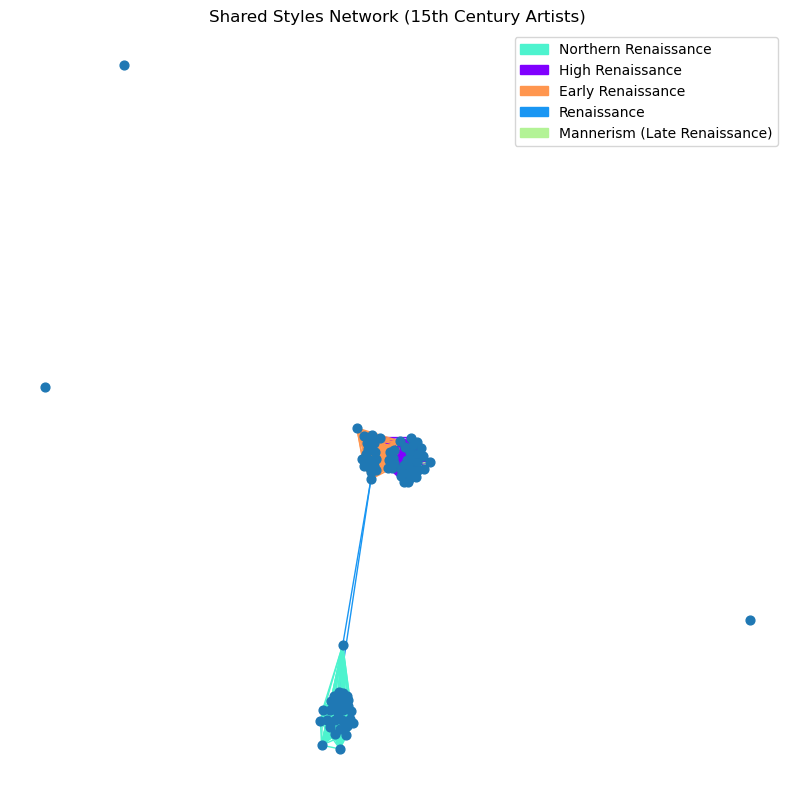

In [308]:
visualize_style_sharing(style_share(artists_15c), "15th Century")

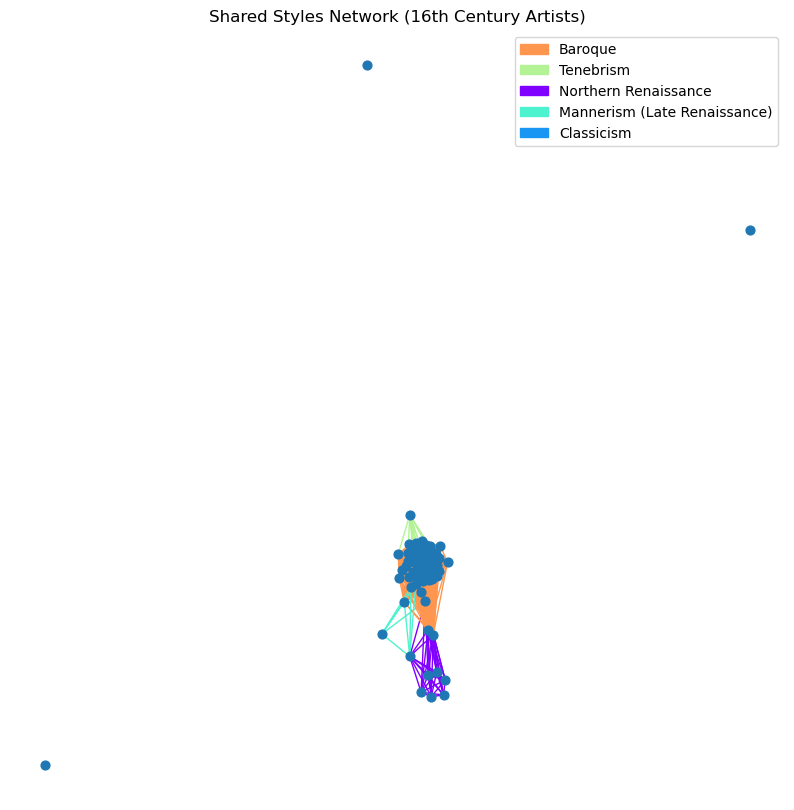

In [309]:
visualize_style_sharing(style_share(artists_16c), "16th Century")

In [310]:
artists_16c.head()

,artist,Nationality,citizenship,gender,styles,movement,Art500k_Movements,birth_place,death_place,birth_year,...,PaintingsExhibitedAt,PaintingsExhibitedAtCount,PaintingSchool,Influencedby,Influencedon,Pupils,Teachers,FriendsandCoworkers,Contemporary,Type
53,Francisco de Zurbaran,Spanish,Spain,male,"Baroque, Unknown",Baroque,{Baroque:96},Fuente de Cantos,Q2807,1598.0,...,"Hungary, Museo del Prado, Paris, Barcelona, B...","{Grenoble:7},{France:19},{Seville:31},{Spain:3...",NaN,"Caravaggio,","Gustave Courbet,",NaN,"Francisco Pacheco,",NaN,No,NaN
71,Georges de la Tour,French,Duchy of Lorraine,male,"Tenebrism, Unknown",Baroque,{Baroque:61},Vic-sur-Seille,Lunéville,1593.0,...,"Germany, Besançon, CA, Gemäldegalerie, France...","{France:14},{Stockton:1},{UK:1},{Albi:1},{Nati...",Caravaggisti,"Caravaggio,",NaN,NaN,NaN,NaN,No,NaN
84,Francesco Ribalta,NaN,Crown of Aragon,male,"Baroque, Tenebrism",Baroque,{Baroque:2},Solsona,Valencia,1565.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
90,Jan van Hemessen,Flemish,Habsburg Netherlands,male,Northern Renaissance,Northern Renaissance,{Northern Renaissance:30},Hemiksem,Antwerp,1500.0,...,"Museo del Prado, Bruges, Spain, US, Germany, C...","{Paris:1},{France:3},{Museo del Prado:2},{Madr...","Flemish School,Antwerp School",NaN,NaN,NaN,NaN,NaN,No,NaN
177,Pieter Saenredam,NaN,Dutch Republic,male,Baroque,Baroque,{Baroque:1},Assendelft,Haarlem,1597.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [311]:
artists_16c.info()

<class 'pandas.core.frame.DataFrame'>
Index: 526 entries, 53 to 10359
Data columns (total 30 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   artist                     526 non-null    object 
 1   Nationality                73 non-null     object 
 2   citizenship                487 non-null    object 
 3   gender                     526 non-null    object 
 4   styles                     69 non-null     object 
 5   movement                   69 non-null     object 
 6   Art500k_Movements          213 non-null    object 
 7   birth_place                509 non-null    object 
 8   death_place                493 non-null    object 
 9   birth_year                 526 non-null    float64
 10  death_year                 520 non-null    float64
 11  FirstYear                  317 non-null    float64
 12  LastYear                   317 non-null    float64
 13  wikiart_pictures_count     69 non-null     float64
 

Text(0, 0.5, 'Count')

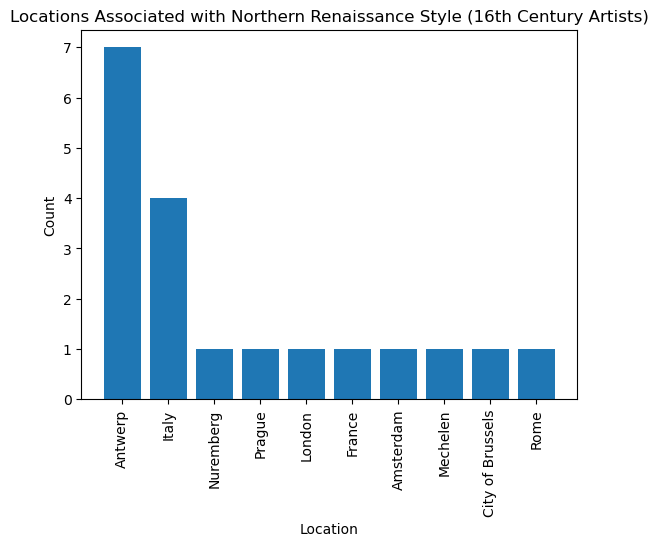

In [312]:
# make a histogram of the locations associated with Northern Renaissance
assoc_locs = dict()
for index, row in artists_16c.iterrows():
    if str(row['styles_extended']).find('Northern Renaissance') > -1:
        # print(row['locations'])
        sep_locs = str(row['locations']).split(",")
        for loc in sep_locs:
            if loc in assoc_locs:
                assoc_locs[loc] += 1
            else:
                assoc_locs[loc] = 1

if 'nan' in assoc_locs:
    del assoc_locs['nan']

# sort dictionary
assoc_locs = dict(sorted(assoc_locs.items(), key=lambda item: item[1], reverse=True))

plt.bar(assoc_locs.keys(), assoc_locs.values())
plt.xticks(rotation=90)
plt.title('Locations Associated with Northern Renaissance Style (16th Century Artists)')
plt.xlabel('Location')
plt.ylabel('Count')

Text(0, 0.5, 'Count')

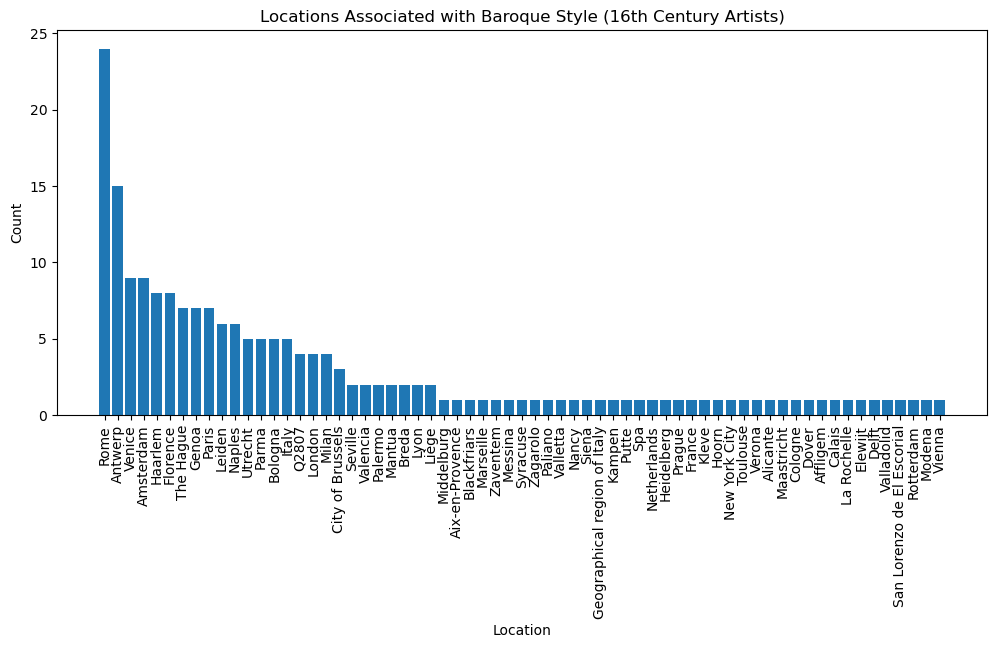

In [313]:
# make a histogram of the locations associated with Baroque
assoc_locs = dict()
for index, row in artists_16c.iterrows():
    if str(row['styles_extended']).find('Baroque') > -1:
        # print(row['locations'])
        sep_locs = str(row['locations']).split(",")
        for loc in sep_locs:
            if loc in assoc_locs:
                assoc_locs[loc] += 1
            else:
                assoc_locs[loc] = 1

if 'nan' in assoc_locs:
    del assoc_locs['nan']

# sort dictionary
assoc_locs = dict(sorted(assoc_locs.items(), key=lambda item: item[1], reverse=True))

plt.figure(figsize=(12, 5))
plt.bar(assoc_locs.keys(), assoc_locs.values())
plt.xticks(rotation=90)
plt.title('Locations Associated with Baroque Style (16th Century Artists)')
plt.xlabel('Location')
plt.ylabel('Count')

In [314]:
artists[artists['artist'] == 'Chen Hongshou'].head()

,artist,Nationality,citizenship,gender,styles,movement,Art500k_Movements,birth_place,death_place,birth_year,...,PaintingsExhibitedAt,PaintingsExhibitedAtCount,PaintingSchool,Influencedby,Influencedon,Pupils,Teachers,FriendsandCoworkers,Contemporary,Type
1801,Chen Hongshou,Chinese,Qing dynasty,male,"Ink and wash painting, Unknown",Ming Dynasty (1368–1644),{Ming Dynasty (1368–1644):15},Zhuji,Zhejiang,1598.0,...,China,{China:1},NaN,NaN,NaN,NaN,NaN,NaN,No,NaN


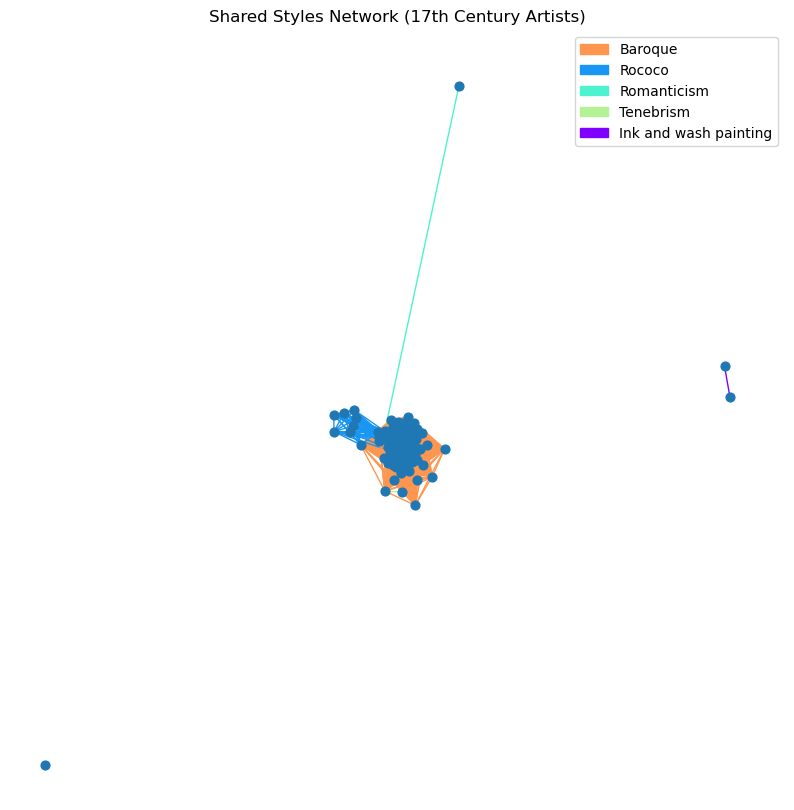

In [315]:
visualize_style_sharing(style_share(artists_17c), "17th Century")

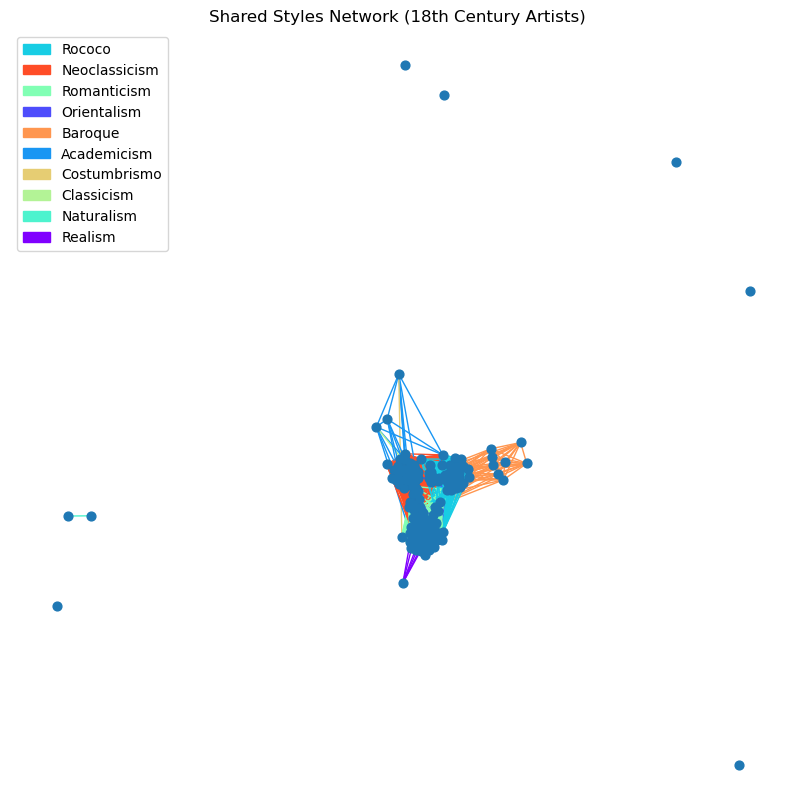

In [316]:
visualize_style_sharing(style_share(artists_18c), "18th Century")

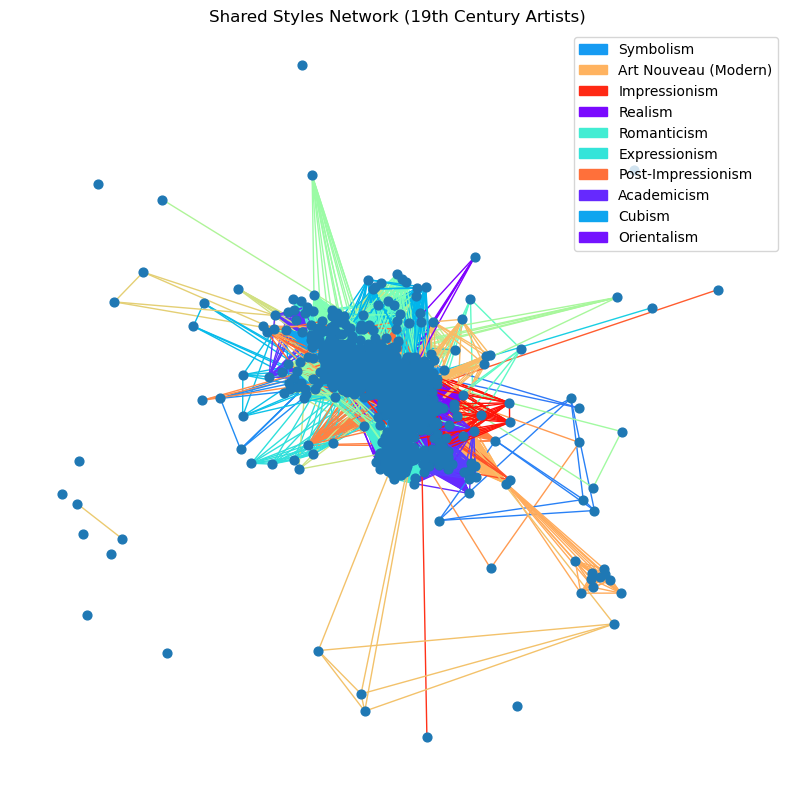

In [317]:
visualize_style_sharing(style_share(artists_19c), "19th Century")

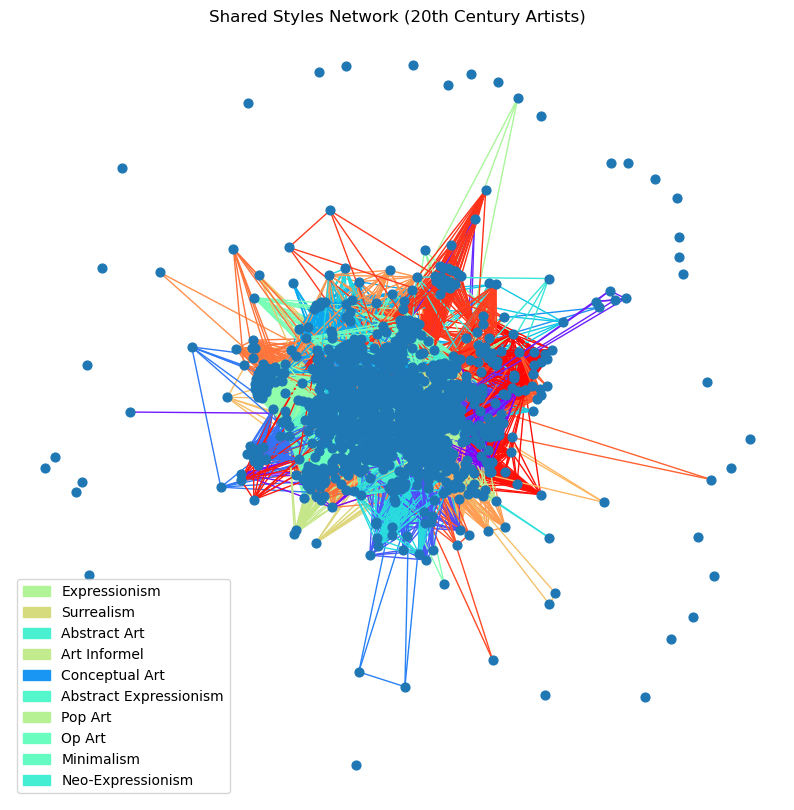

In [318]:
visualize_style_sharing(style_share(artists_20c), "20th Century")

In [319]:
# for each century block, create a visualization based on co-exhibition
print("Exhibition Count: ", artists['PaintingsExhibitedAt'].count())
print(artists['PaintingsExhibitedAt'].value_counts())

Exhibition Count:  3697
PaintingsExhibitedAt
Amsterdam                                                                                                                                                                                                                                                                                                                   158
Italy                                                                                                                                                                                                                                                                                                                       138
France                                                                                                                                                                                                                                                                                                                     

In [320]:
# future potential: weight the edges based on # of shared exhibitions
def shared_exhibitions(artists):
  G = nx.Graph()
  artists = artists[["artist", "PaintingsExhibitedAt"]]
  artists = artists.dropna()
  G.add_nodes_from(artists["artist"])

  exhibitions_to_artists = dict()
  for index, row in artists.iterrows():
    for exhibition in row["PaintingsExhibitedAt"].split(","):
      if exhibition in exhibitions_to_artists:
        exhibitions_to_artists[exhibition].append(row["artist"])
      else:
        exhibitions_to_artists[exhibition] = [row["artist"]]

  for exhibition in exhibitions_to_artists:
    for artist1 in exhibitions_to_artists[exhibition]:
      for artist2 in exhibitions_to_artists[exhibition]:
        if artist1 != artist2 and not G.has_edge(artist1, artist2):
          G.add_edge(artist1, artist2)

  return G

In [321]:
def visualize_exhibition_sharing(G, tag):
  plt.figure(figsize=(10, 10)) # Increase figure size for better visibility
  pos = nx.spring_layout(G, k=0.5, iterations=50) # Use spring layout with increased 'k' for spacing
  nx.draw_networkx(G, pos, with_labels=False, node_size=40, width=0.5, alpha=0.7)
  plt.title('Shared Exhibitions Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

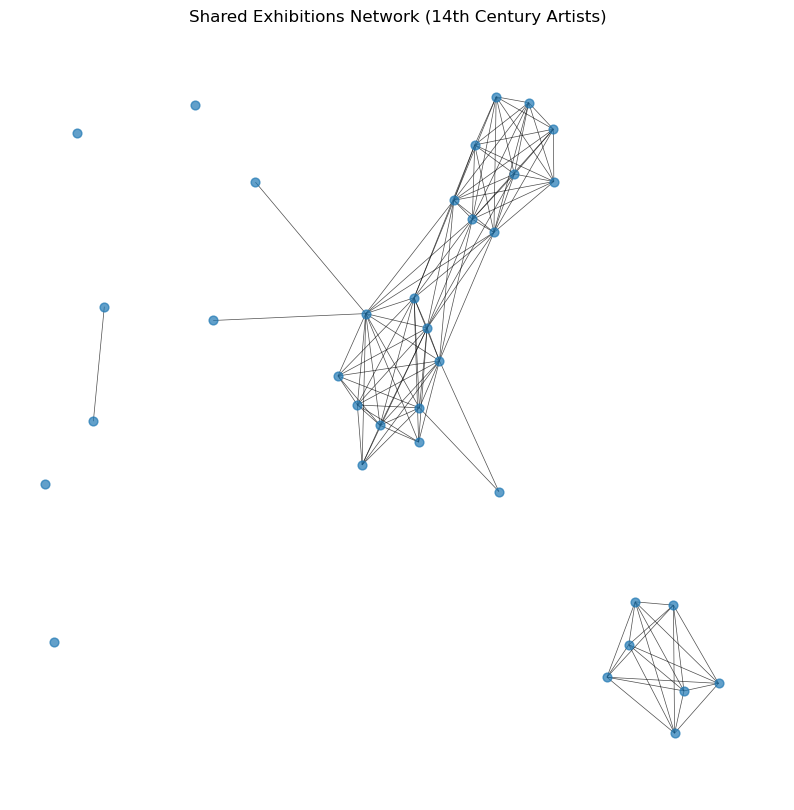

In [322]:
visualize_exhibition_sharing(shared_exhibitions(artists_14c), "14th Century")

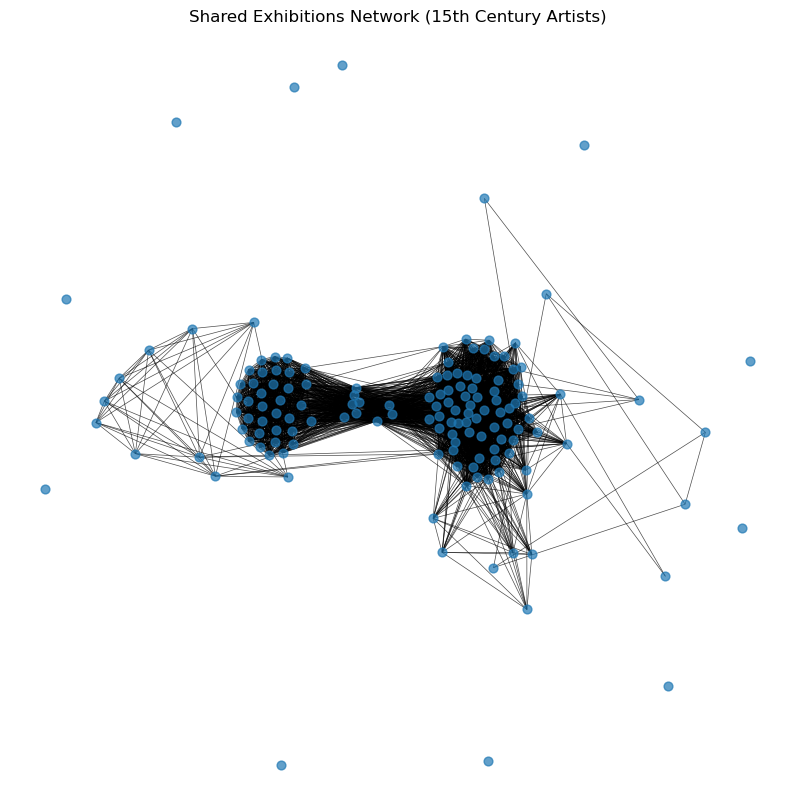

In [323]:
visualize_exhibition_sharing(shared_exhibitions(artists_15c), "15th Century")

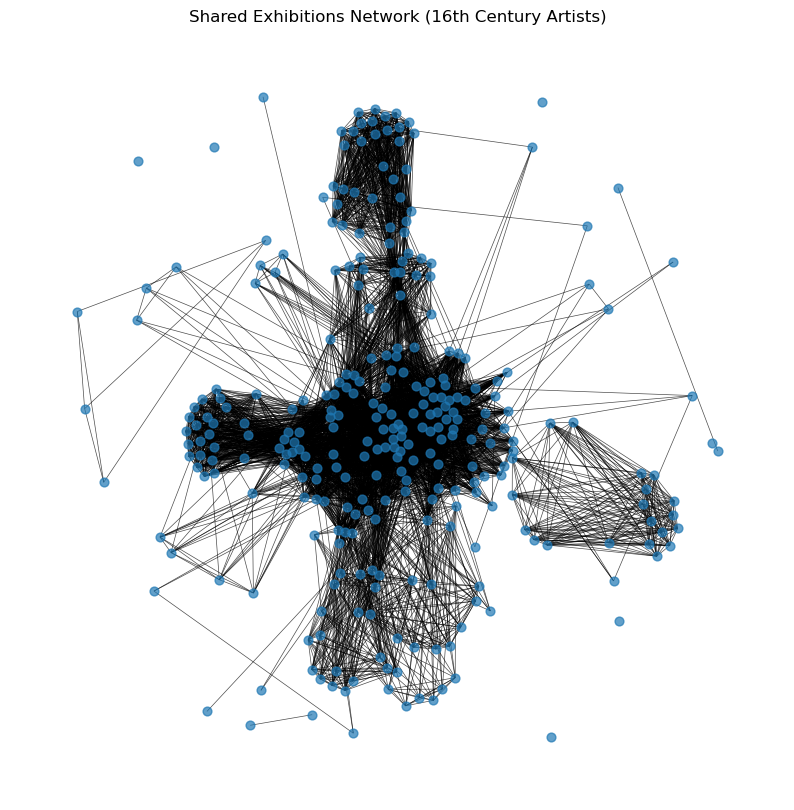

In [324]:
visualize_exhibition_sharing(shared_exhibitions(artists_16c), "16th Century")

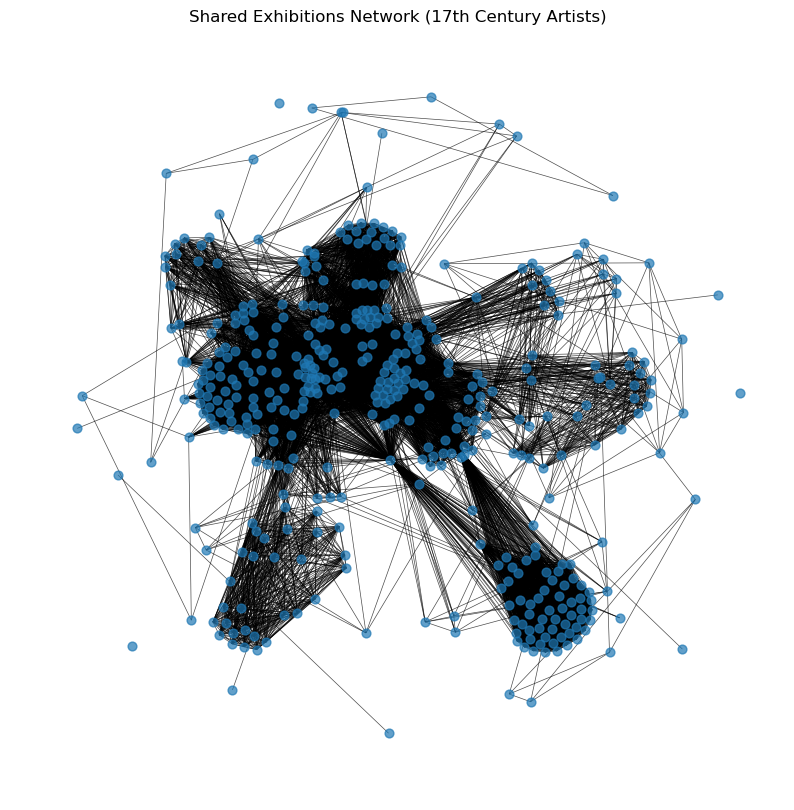

In [325]:
visualize_exhibition_sharing(shared_exhibitions(artists_17c), "17th Century")

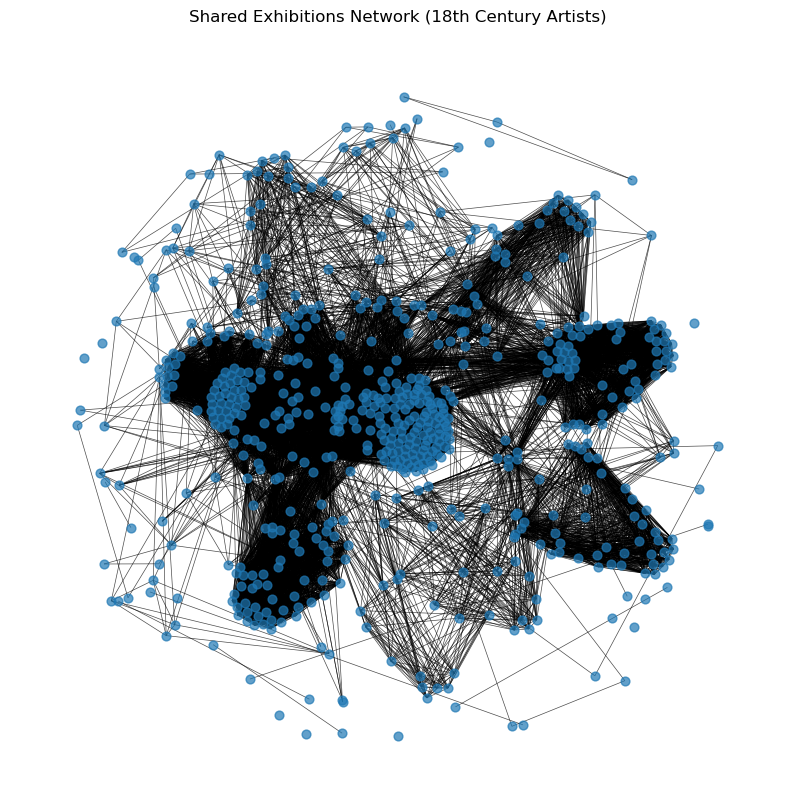

In [326]:
visualize_exhibition_sharing(shared_exhibitions(artists_18c), "18th Century")

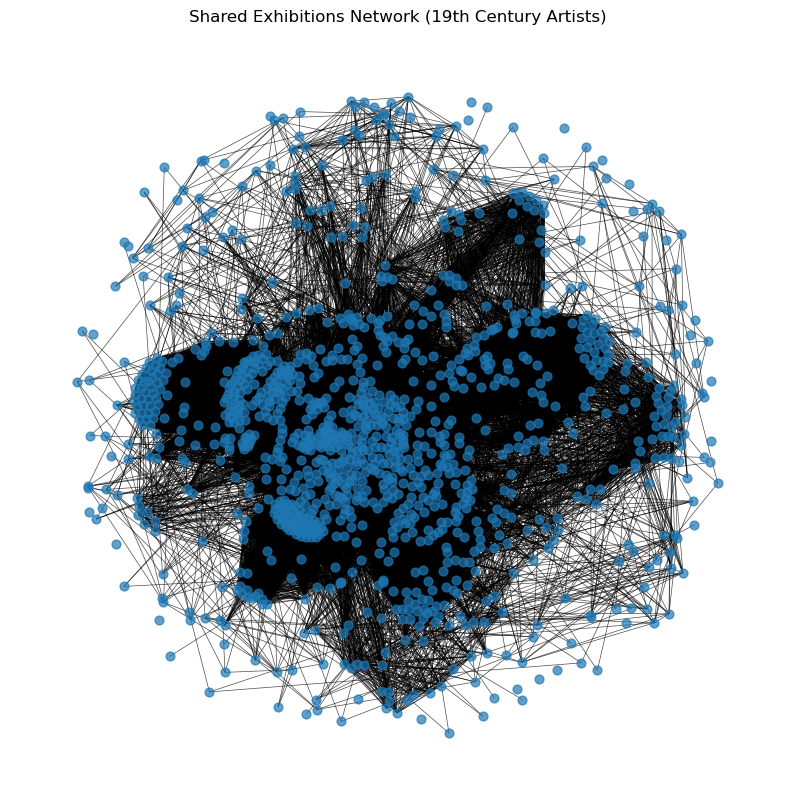

In [327]:
visualize_exhibition_sharing(shared_exhibitions(artists_19c), "19th Century")

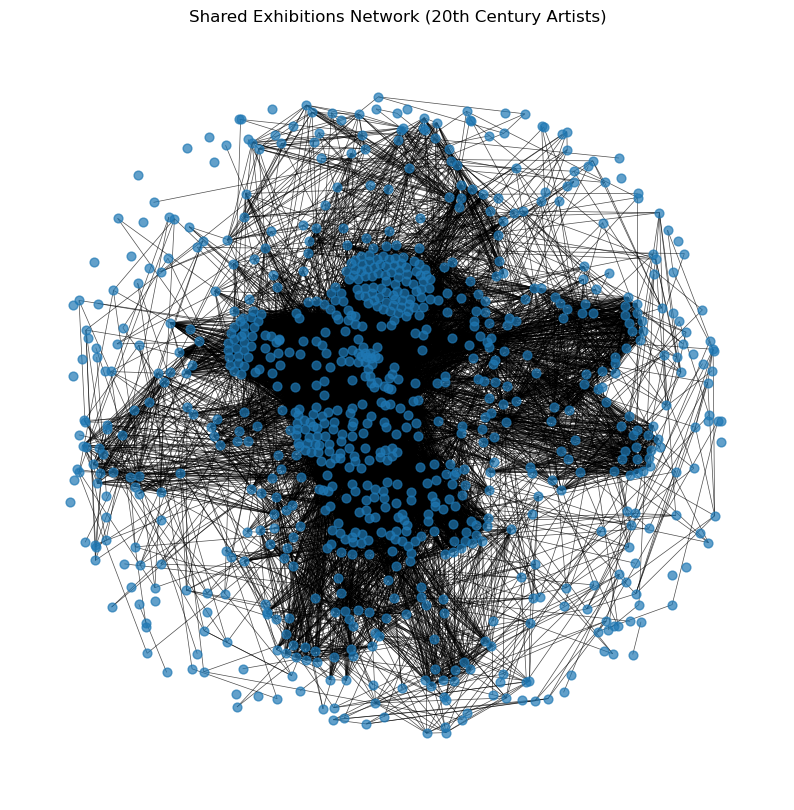

In [328]:
visualize_exhibition_sharing(shared_exhibitions(artists_20c), "20th Century")

In [329]:
# for each century block, create a visualization based on influence/teacher/friend relationships (might be too sparse)
def artist_relationships(artists):
  G = nx.DiGraph()
  artists = artists[["artist", "birth_year", "Influencedby", "Influencedon", "Pupils", "Teachers", "FriendsandCoworkers", "styles_extended"]]
  artists = artists.dropna(how='all')
  # print("Number of artists with relationship data: ", artists.shape[0])
  G.add_nodes_from(artists["artist"].dropna().unique())

  for _, row in artists.iterrows():
    if row["Influencedby"] is not None:
      influences = str(row["Influencedby"]).split(",")
      for influence in influences:
        if influence in G:
          G.add_edge(influence, row["artist"], edge_type="influenced")

  for _, row in artists.iterrows():
    if row["Influencedon"] is not None:
      influencees = str(row["Influencedon"]).split(",")
      for influencee in influencees:
        if influencee in G and not G.has_edge(row["artist"], influencee):
          G.add_edge(row["artist"], influencee, edge_type="influenced")

  for _, row in artists.iterrows():
    if row["Pupils"] is not None:
      pupils = str(row["Pupils"]).split(",")
      for pupil in pupils:
        if pupil in G:
          G.add_edge(row["artist"], pupil, edge_type="taught")

  for _, row in artists.iterrows():
    if row["Teachers"] is not None:
      teachers = str(row["Teachers"]).split(",")
      for teacher in teachers:
        if teacher in G and not G.has_edge(teacher, row["artist"]):
          G.add_edge(teacher, row["artist"], edge_type="taught")

  for _, row in artists.iterrows():
    if row["FriendsandCoworkers"] is not None:
      friends = str(row["FriendsandCoworkers"]).split(",")
      for friend in friends:
        if friend in G:
          # to make a DAG, add edge from older to younger artist
          if row["birth_year"] is not None and artists[artists["artist"] == friend]["birth_year"].values[0] is not None:
            older_artist = row["artist"] if row["birth_year"] < artists[artists["artist"] == friend]["birth_year"].values[0] else friend
            younger_artist = friend if older_artist == row["artist"] else row["artist"]
          else: # handle missing birth year case
            older_artist = row["artist"]
            younger_artist = friend
          if not G.has_edge(older_artist, younger_artist):
            G.add_edge(older_artist, younger_artist, edge_type="friend")
  
  # drop nodes that don't have any edges
  for node in list(G.nodes()):
    if G.degree(node) == 0:
      G.remove_node(node)

  # drop arbitrary edges to break cycles, and simultaneously look for interesting cycles
  # notably, this does NOT find all cycles in the graph, but it does a good enough job of finding enough
  print("POTENTIALLY INTERESTING CYCLES:")
  try:
    while True:
        cycle = nx.find_cycle(G, orientation='original')
        cycle_str = cycle[0][0] + " --> " + cycle[0][1]
        for edge in cycle[1:]:
          cycle_str += " --> " + edge[1]
        print(cycle_str)
        # remove one edge from the cycle
        G.remove_edge(*cycle[0][:2])
  except nx.NetworkXNoCycle:
      pass
  
  # color each node based on corresponding artist's most common style
  for node in G.nodes():
    styles = artists[artists["artist"] == node]["styles_extended"]
    if styles.count() > 0:
      style_counts = parse_styles(styles.values[0])
      if style_counts:
        dominant_style = max(style_counts, key=style_counts.get)
        G.nodes[node]['style'] = dominant_style
      else:
        G.nodes[node]['style'] = 'Unknown'
    else:
      G.nodes[node]['style'] = 'Unknown'


  # print("Number of nodes: ", G.number_of_nodes())
  # print("Number of edges: ", G.number_of_edges())
  return G

In [330]:
def visualize_artist_relationships(G, tag):

  # define color mapping
  color_map = {
      "influenced": "orange",
      "taught": "blue",
      "friend": "purple"
  }

  # extract edge colors
  edge_colors = [
      color_map[G[u][v]["edge_type"]]
      for u, v in G.edges()
  ]

  # node colors
  styles = sorted(set(
    G.nodes[n].get("style", "Unknown")
    for n in G.nodes()
))

  # generate distinct colors automatically
  cmap = cm.get_cmap('tab20', len(styles))

  style_to_color = {
    style: mcolors.to_hex(cmap(i))
    for i, style in enumerate(styles)
  }

  # color each node according to style
  node_colors = [
    style_to_color[G.nodes[n].get("style", "Unknown")]
    for n in G.nodes()
  ]

  # edge legend
  edge_legend = [
        Line2D(
            [0], [0],
            color=color,
            lw=2,
            label=edge_type
        )
        for edge_type, color in color_map.items()
    ]
  
  # style legend
  style_legend = [
        Line2D(
            [0], [0],
            marker='o',
            color='w',
            markerfacecolor=color,
            markersize=8,
            label=style
        )
        for style, color in style_to_color.items()
    ]
  

  plt.figure(figsize=(10, 10)) # increase figure size for better visibility
  # plot network with a forest-like layout
  pos = nx.spring_layout(G, k=0.5, iterations=50)
  
  nx.draw(G, pos, with_labels=True, node_size=70, label=True, edge_color=edge_colors, node_color=node_colors)
  
  # add legends separately
  first_legend = plt.legend(
        handles=edge_legend,
        loc='upper right',
        title="Edge Type"
    )
  
  # add legends for edge and node colors
  plt.gca().add_artist(first_legend)
  
  plt.legend(
        handles=style_legend,
        loc='lower left',
        title="Dominant Style",
        fontsize=8
    )
  plt.title('Relationship Network (' + tag + ' Artists)')
  plt.axis('off')
  plt.show()

POTENTIALLY INTERESTING CYCLES:


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))


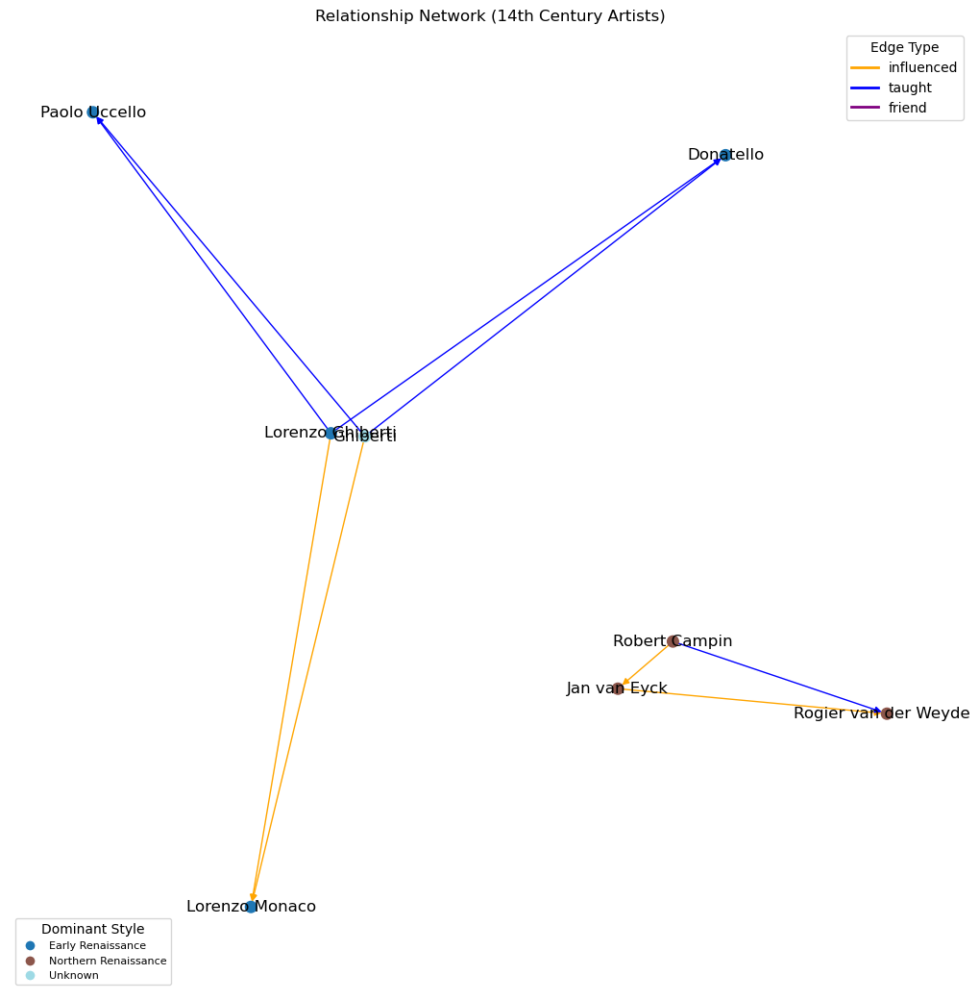

In [331]:
artist_relationships_14c = artist_relationships(artists_14c)
visualize_artist_relationships(artist_relationships_14c, "14th Century")
# print edges
# print("Edges: ", artist_relationships_14c.edges(data=True))

POTENTIALLY INTERESTING CYCLES:
Mariotto Albertinelli --> Pietro Perugino --> Mariotto Albertinelli


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))


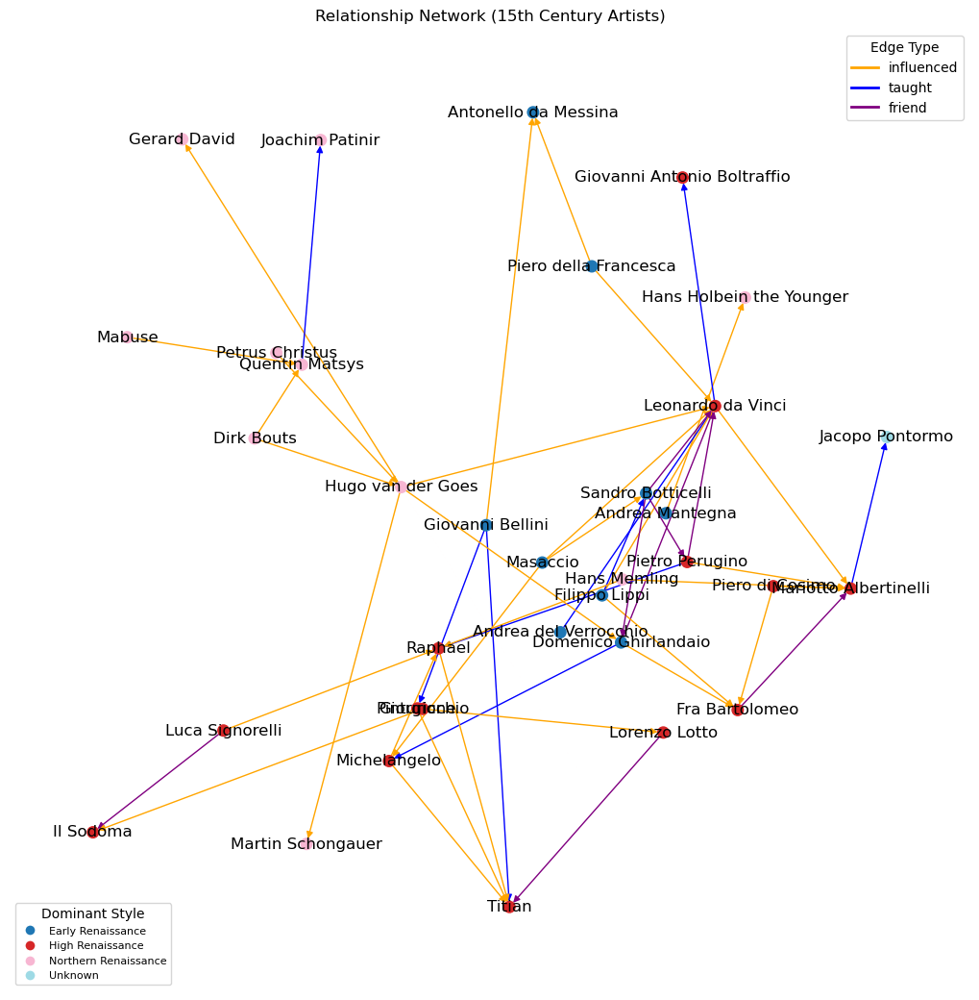

In [332]:
artist_relationships_15c = artist_relationships(artists_15c)
visualize_artist_relationships(artist_relationships_15c, "15th Century")

POTENTIALLY INTERESTING CYCLES:

/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))



Adam van Noort --> Peter Paul Rubens --> Jacob Jordaens --> Adam van Noort
Adam van Noort --> Jacob Jordaens --> Adam van Noort


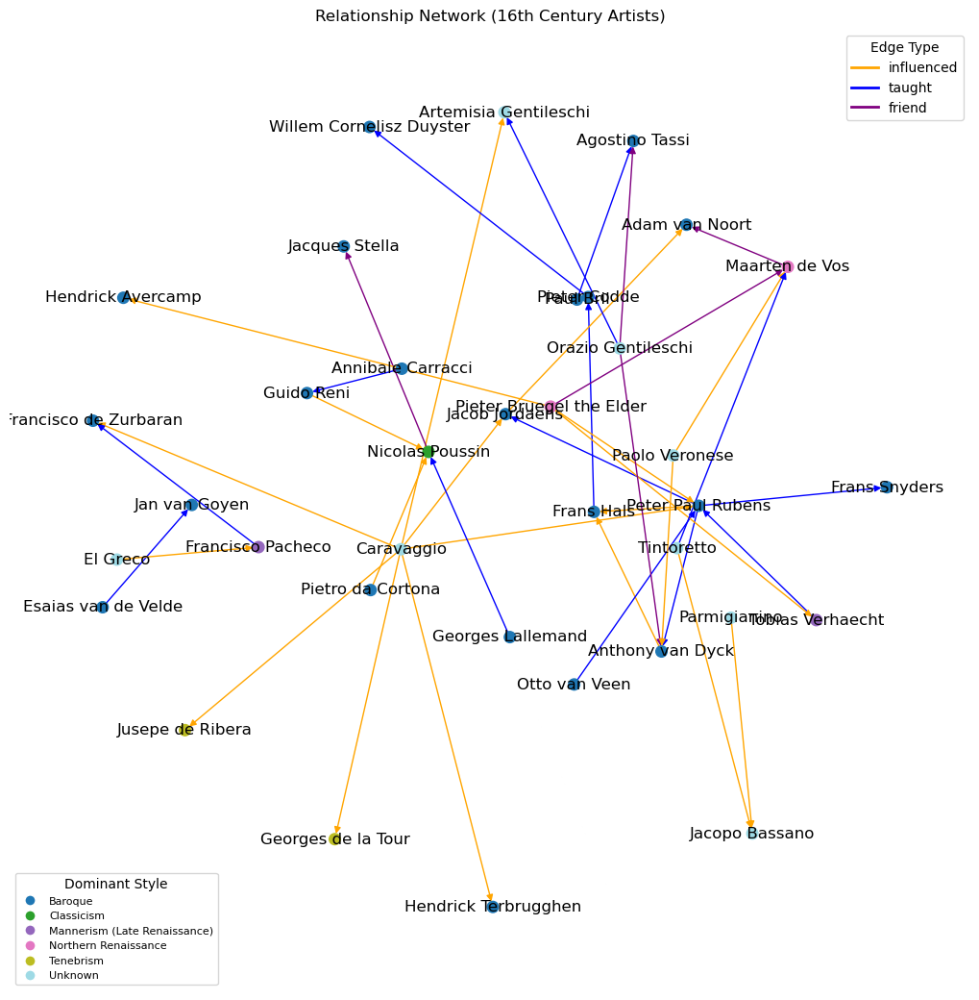

In [333]:
artist_relationships_16c = artist_relationships(artists_16c)
visualize_artist_relationships(artist_relationships_16c, "16th Century")

POTENTIALLY INTERESTING CYCLES:


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))


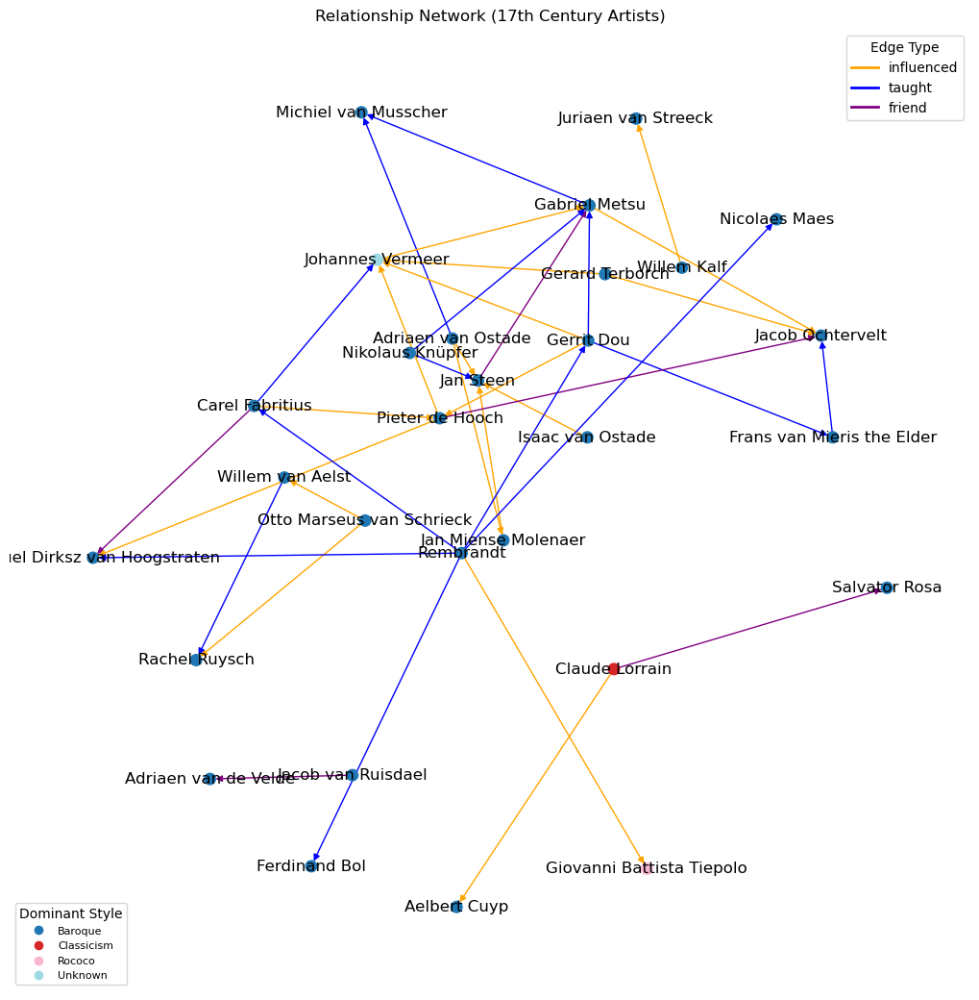

In [334]:
artist_relationships_17c = artist_relationships(artists_17c)
visualize_artist_relationships(artist_relationships_17c, "17th Century")

POTENTIALLY INTERESTING CYCLES:
Gilbert Stuart --> Benjamin West --> Gilbert Stuart
Fyodor Alekseyev --> Sylvester Shchedrin --> Fyodor Alekseyev


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))


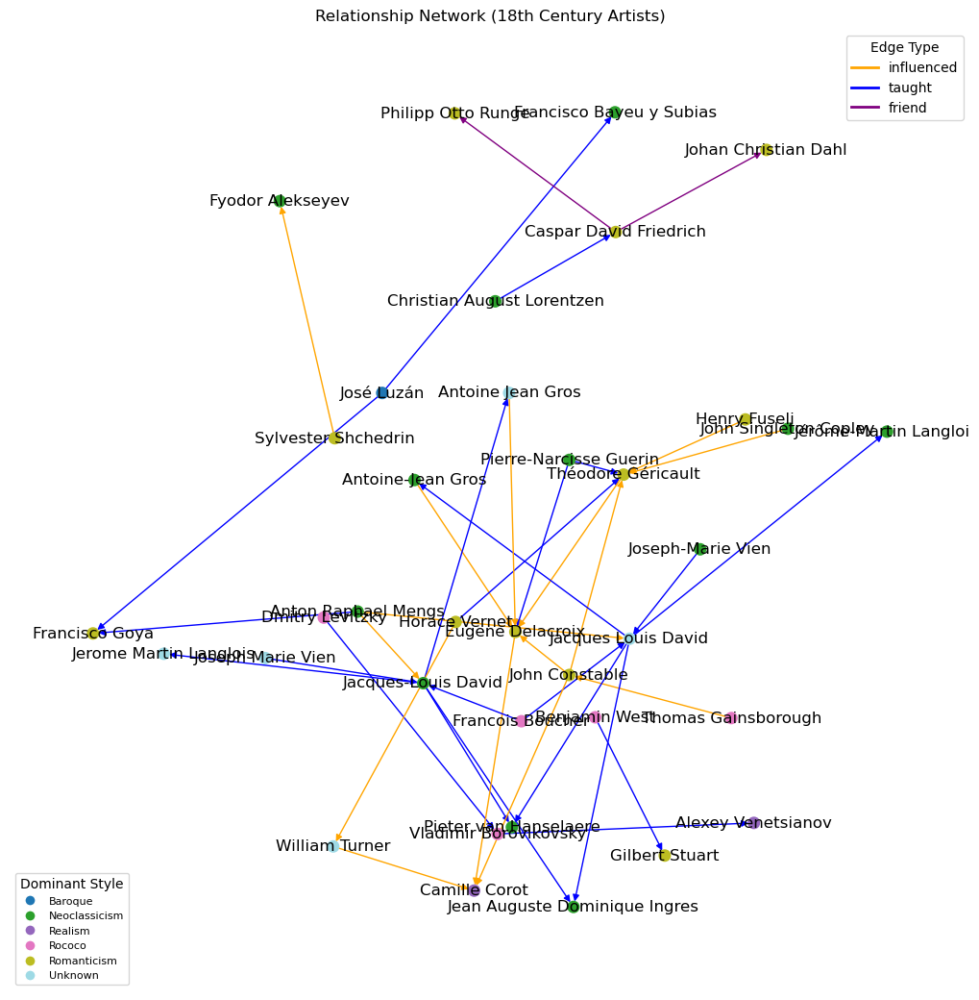

In [335]:
artist_relationships_18c = artist_relationships(artists_18c)
visualize_artist_relationships(artist_relationships_18c, "18th Century")

POTENTIALLY INTERESTING CYCLES:
Edward Hopper --> Robert Henri --> Edward Hopper
Edward Hopper --> Rockwell Kent --> Edward Hopper
Alexander Khvostenko-Khvostov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Victor Palmov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Vladimir Tatlin --> Alexander Khvostenko-Khvostov
Frank W. Benson --> Willard Metcalf --> Frank W. Benson
William Adolphe Bouguereau --> Paul Émile Chabas --> William Adolphe Bouguereau
Alexandre-Jacques Chantron --> William Adolphe Bouguereau --> Alexandre-Jacques Chantron
David Alfaro Siqueiros --> Umberto Boccioni --> David Alfaro Siqueiros
Chaim Soutine --> Michel Kikoine --> Chaim Soutine
Marc Chagall --> Pablo Picasso --> Piet Mondrian --> Fernand Leger --> Constantin Brâncuși --> Amedeo Modigliani --> Chaim Soutine --> Marc Chagall
David Burliuk --> Victor Palmov --> David Burliuk
Vasyl Yermylov --> David Burliuk --> Vasyl Yermylov
Fernan

/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))


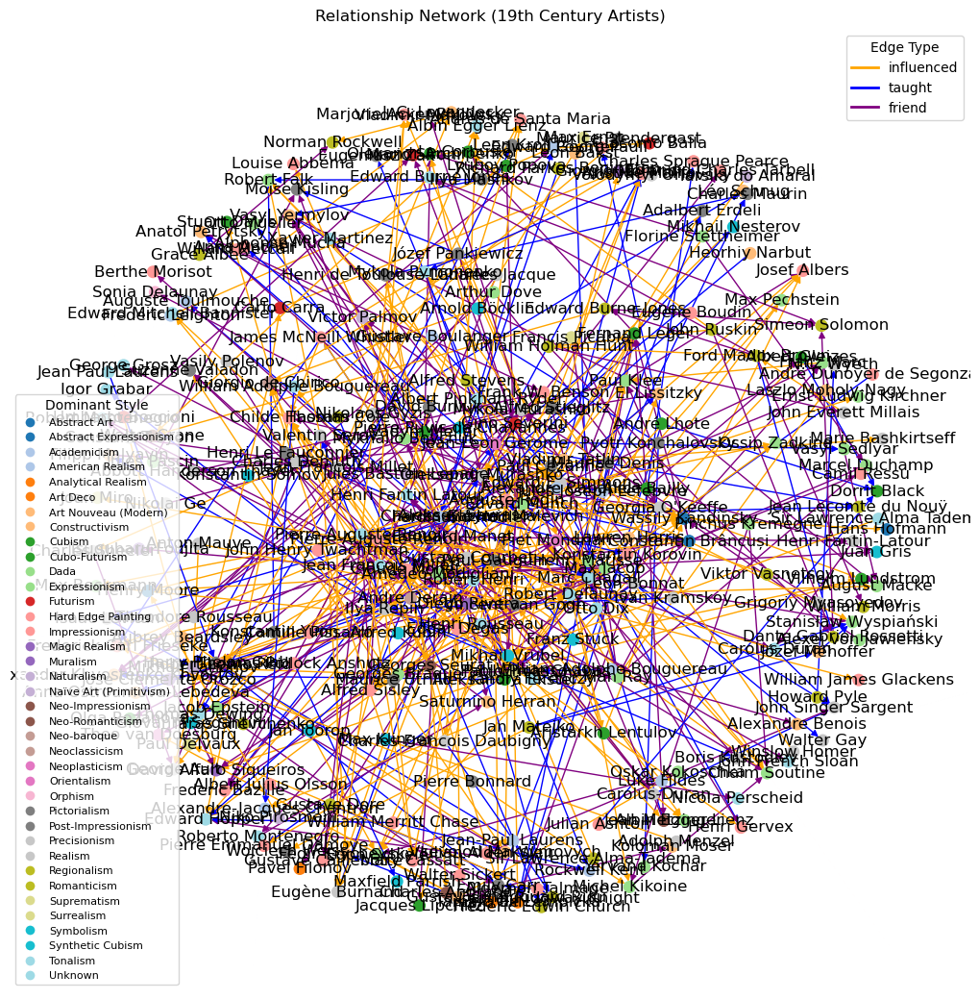

In [336]:
artist_relationships_19c = artist_relationships(artists_19c)
visualize_artist_relationships(artist_relationships_19c, "19th Century")

POTENTIALLY INTERESTING CYCLES:
Sigmar Polke --> Joseph Beuys --> Sigmar Polke
Jackson Pollock --> Lee Krasner --> Jackson Pollock
Ad Reinhardt --> Mark Rothko --> Jackson Pollock --> Ad Reinhardt
Ad Reinhardt --> Barnett Newman --> Jackson Pollock --> Ad Reinhardt
Erik Bulatov --> Ilya Kabakov --> Erik Bulatov
Allan Kaprow --> Wolf Kahn --> Allan Kaprow
Arshile Gorky --> Giorgio Cavallon --> Arshile Gorky
Dennis Oppenheim --> Vito Acconci --> Dennis Oppenheim
Joseph Beuys --> Yoko Ono --> Joseph Beuys
Joseph Beuys --> Robert Smithson --> Joseph Beuys
Joseph Beuys --> Rosemarie Trockel --> Joseph Beuys
Victor Brauner --> Vlady --> Victor Brauner


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/1141738695.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))


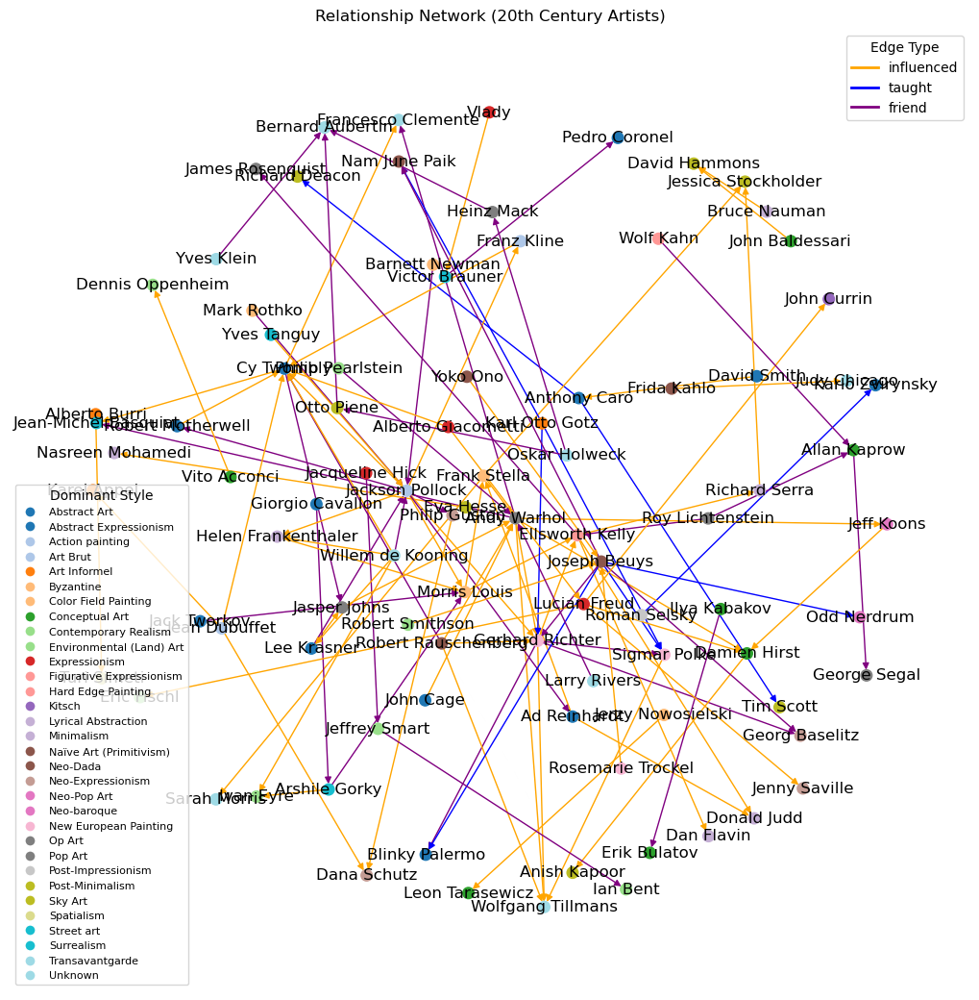

In [337]:
artist_relationships_20c = artist_relationships(artists_20c)
visualize_artist_relationships(artist_relationships_20c, "20th Century")

In [338]:
print("14th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_14c))

14th century relationship graph is DAG: True


In [339]:
print("15th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_15c))

15th century relationship graph is DAG: True


In [340]:
print("16th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_16c))

16th century relationship graph is DAG: True


In [341]:
print("17th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_17c))

17th century relationship graph is DAG: True


In [342]:
print("18th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_18c))

18th century relationship graph is DAG: True


In [343]:
print("19th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_19c))

19th century relationship graph is DAG: True


In [344]:
print("20th century relationship graph is DAG:", nx.is_directed_acyclic_graph(artist_relationships_20c))

20th century relationship graph is DAG: True


In [374]:
# skeletonize relationship network by removing redundant edges for each type of relationship
def skeletonize_relationship_network(G):
    influenced_edges = [(u, v) for u, v, data in G.edges(data=True) if data['edge_type'] == 'influenced']
    taught_edges = [(u, v) for u, v, data in G.edges(data=True) if data['edge_type'] == 'taught']
    friend_edges = [(u, v) for u, v, data in G.edges(data=True) if data['edge_type'] == 'friend']
    edges_to_add_back = set()
    # keep longest directed paths possible for each type of edge
    # for influenced edges, if there is more than one path from u to v, remove the direct edge
    for u, v in influenced_edges:
        G.remove_edge(u, v)
        if not nx.has_path(G, u, v):
            edges_to_add_back.add((u, v, "influenced"))
    for u, v in taught_edges:
        G.remove_edge(u, v)
        if not nx.has_path(G, u, v):
            edges_to_add_back.add((u, v, "taught"))
    for u, v in friend_edges: 
        G.remove_edge(u, v)       
        if not nx.has_path(G, u, v):
            edges_to_add_back.add((u, v, "friend"))
    for u, v, edge_type in edges_to_add_back:
        G.add_edge(u, v, edge_type=edge_type)

    # find longest path in the DAG, along with dominant style of the artists along the path, and print it out
    longest_path = nx.dag_longest_path(G)
    print("Longest path in the DAG: ")
    path_str = longest_path[0]
    for i in range(1, len(longest_path)):
        path_str += " --> " + longest_path[i] + " (style: " + G.nodes[longest_path[i]]['style'] + ")"
    print(path_str)

    return G

In [375]:
def visualize_skeletonized_relationships(G, tag):
    import matplotlib.pyplot as plt
    import networkx as nx

    color_map = {
        "influenced": "orange",
        "taught": "blue",
        "friend": "purple"
    }

    edge_colors = [
        color_map[G[u][v]["edge_type"]]
        for u, v in G.edges()
    ]

    # node colors
    styles = sorted(set(
        G.nodes[n].get("style", "Unknown")
        for n in G.nodes()
    ))

    # generate distinct colors automatically
    cmap = cm.get_cmap('tab20', len(styles))

    style_to_color = {
        style: mcolors.to_hex(cmap(i))
        for i, style in enumerate(styles)
    }

    # color each node according to style
    node_colors = [
        style_to_color[G.nodes[n].get("style", "Unknown")]
        for n in G.nodes()
    ]

    # Compute levels
    levels = {}
    for node in nx.topological_sort(G):
        parents = list(G.predecessors(node))
        levels[node] = 0 if not parents else max(levels[p] for p in parents) + 1

    # Group by layer
    layers = {}
    for node, level in levels.items():
        layers.setdefault(level, []).append(node)

    # Spacing parameters
    x_spacing = 3
    y_spacing = 2

    # Compute positions
    pos = {}
    for level, nodes in layers.items():
        width = len(nodes)
        for i, node in enumerate(nodes):
            x = (i - width / 2) * x_spacing
            y = -level * y_spacing
            pos[node] = (x, y)

    plt.figure(figsize=(12, 12))

    nx.draw_networkx_nodes(G, pos, node_size=300, node_color=node_colors)
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors)

    nx.draw_networkx_labels(G, pos,font_size=8)

    # edge legend
    edge_legend = [
            Line2D(
                [0], [0],
                color=color,
                lw=2,
                label=edge_type
            )
            for edge_type, color in color_map.items()
        ]
  
    # style legend
    style_legend = [
            Line2D(
                [0], [0],
                marker='o',
                color='w',
                markerfacecolor=color,
                markersize=8,
                label=style
            )
            for style, color in style_to_color.items()
        ]

    legend_elements = [
        plt.Line2D([0], [0], color=color, lw=2, label=type_)
        for type_, color in color_map.items()
    ]

    # add legends separately
    first_legend = plt.legend(
            handles=edge_legend,
            loc='upper right',
            title="Edge Type"
        )
    
    # add legends for edge and node colors
    plt.gca().add_artist(first_legend)
    
    plt.legend(
            handles=style_legend,
            loc='lower left',
            title="Dominant Style",
            fontsize=8
        )
    plt.title(f'Relationship Network ({tag} Artists)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

Longest path in the DAG: 
Robert Campin --> Jan van Eyck (style: Northern Renaissance) --> Rogier van der Weyden (style: Northern Renaissance)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


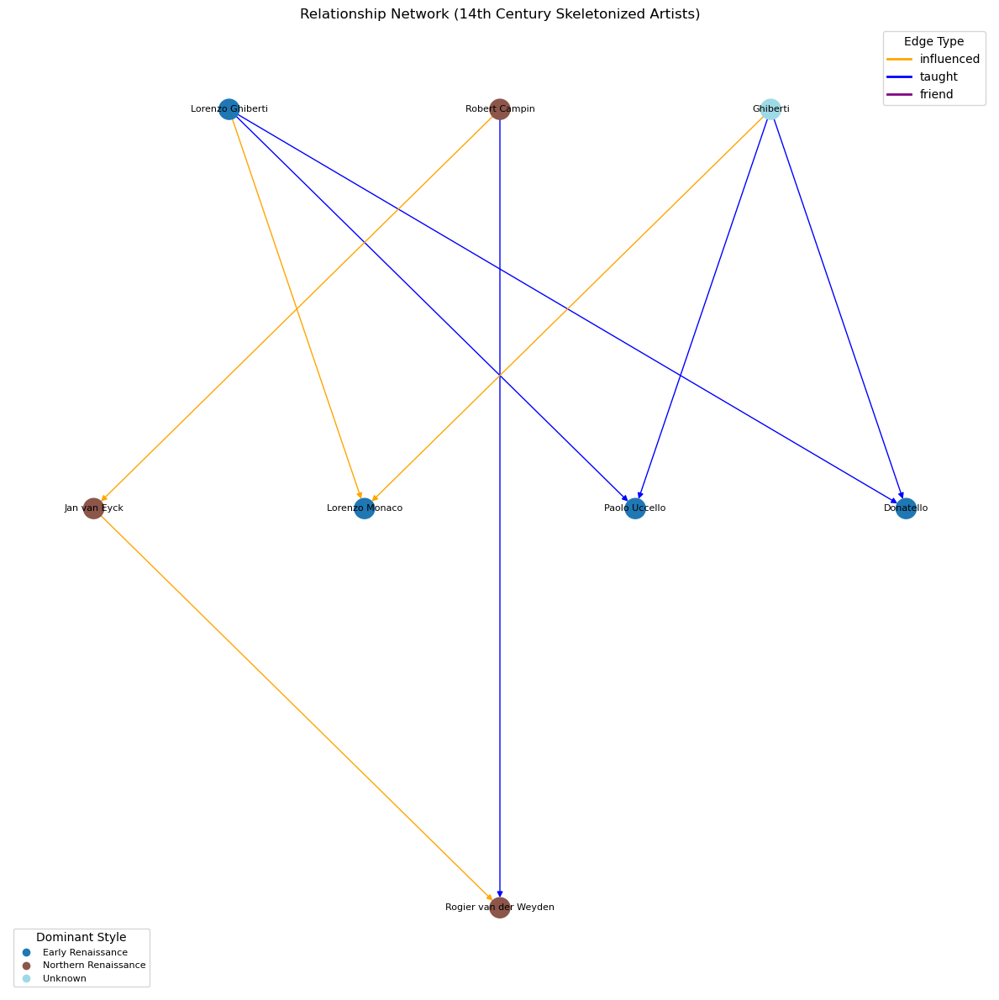

In [376]:
skeletonized_artist_relationships_14c = skeletonize_relationship_network(artist_relationships_14c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_14c, "14th Century Skeletonized")

Longest path in the DAG: 
Filippo Lippi --> Sandro Botticelli (style: Early Renaissance) --> Domenico Ghirlandaio (style: Early Renaissance) --> Michelangelo (style: High Renaissance) --> Raphael (style: High Renaissance) --> Titian (style: High Renaissance)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


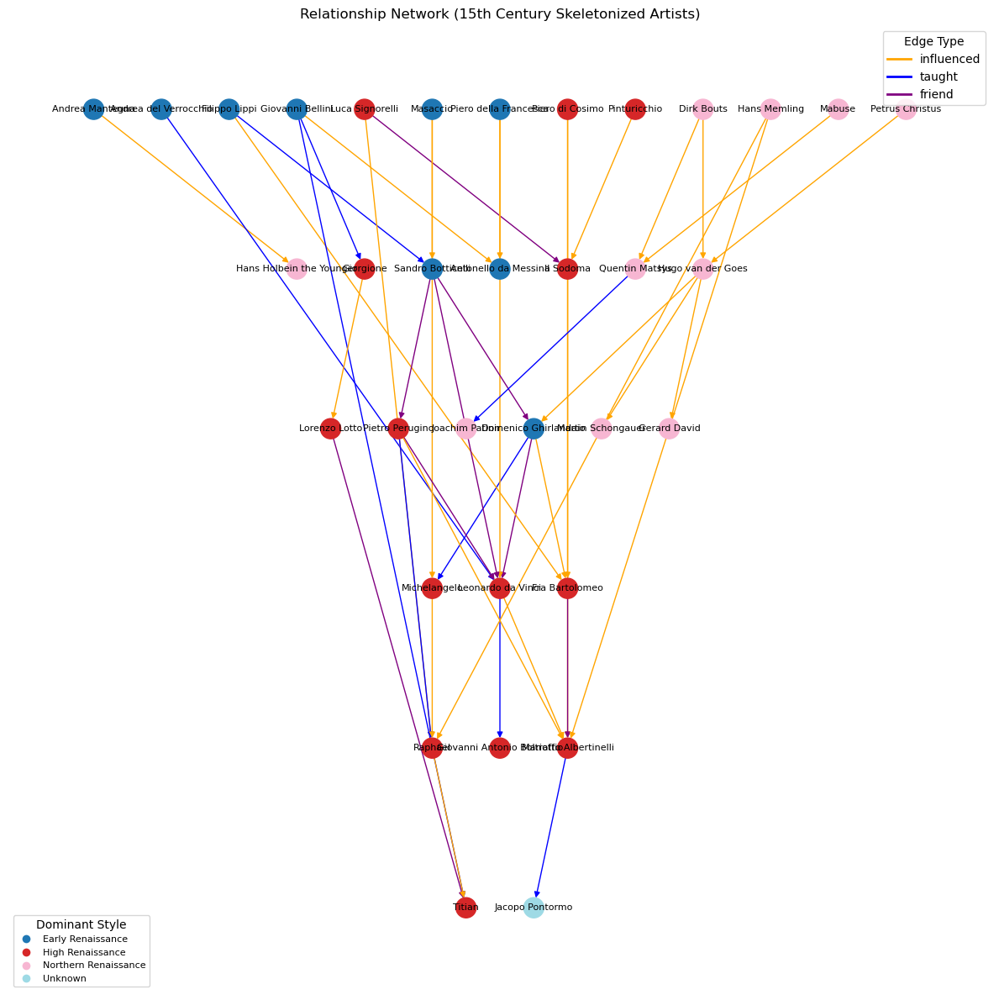

In [377]:
skeletonized_artist_relationships_15c = skeletonize_relationship_network(artist_relationships_15c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_15c, "15th Century Skeletonized")

Longest path in the DAG: 
Pieter Bruegel the Elder --> Tobias Verhaecht (style: Mannerism (Late Renaissance)) --> Peter Paul Rubens (style: Baroque) --> Anthony van Dyck (style: Baroque) --> Frans Hals (style: Baroque) --> Pieter Codde (style: Baroque) --> Willem Cornelisz Duyster (style: Baroque)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


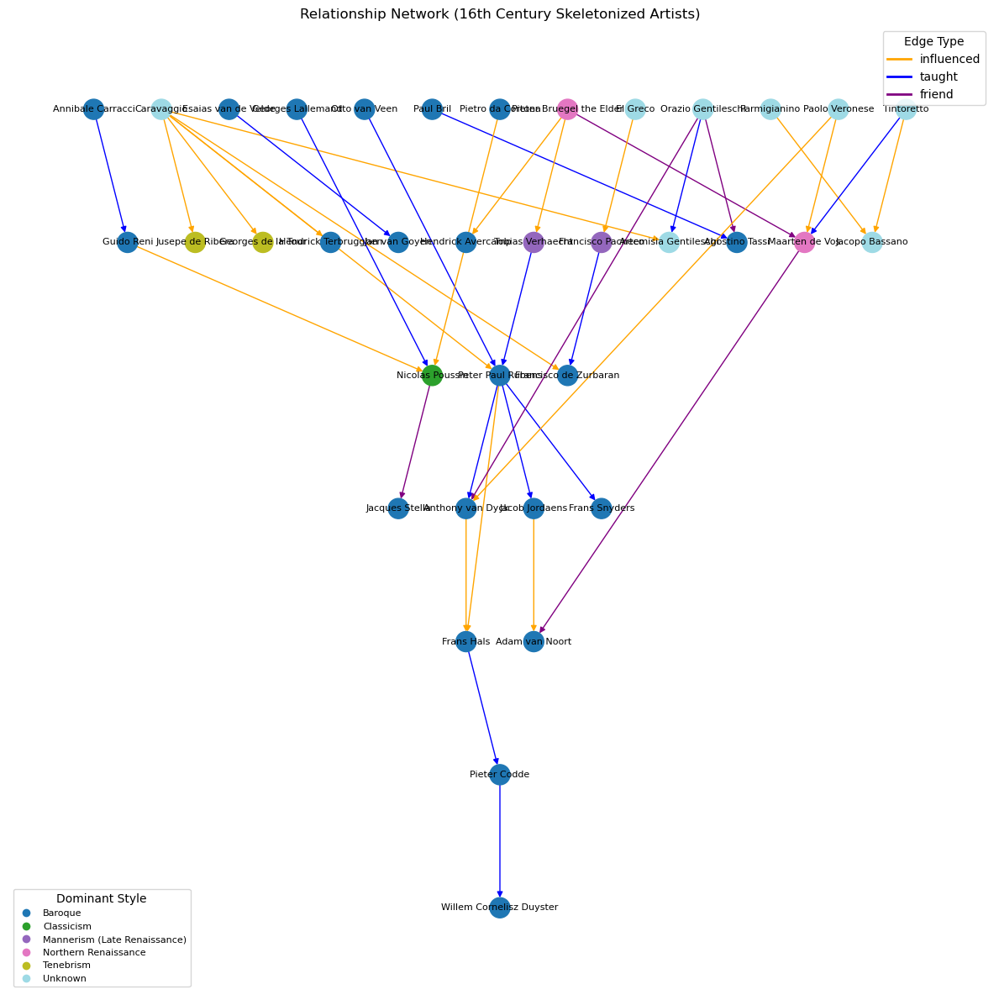

In [378]:
skeletonized_artist_relationships_16c = skeletonize_relationship_network(artist_relationships_16c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_16c, "16th Century Skeletonized")

Longest path in the DAG: 
Rembrandt --> Carel Fabritius (style: Baroque) --> Pieter de Hooch (style: Baroque) --> Johannes Vermeer (style: Unknown) --> Gabriel Metsu (style: Baroque) --> Jacob Ochtervelt (style: Baroque)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


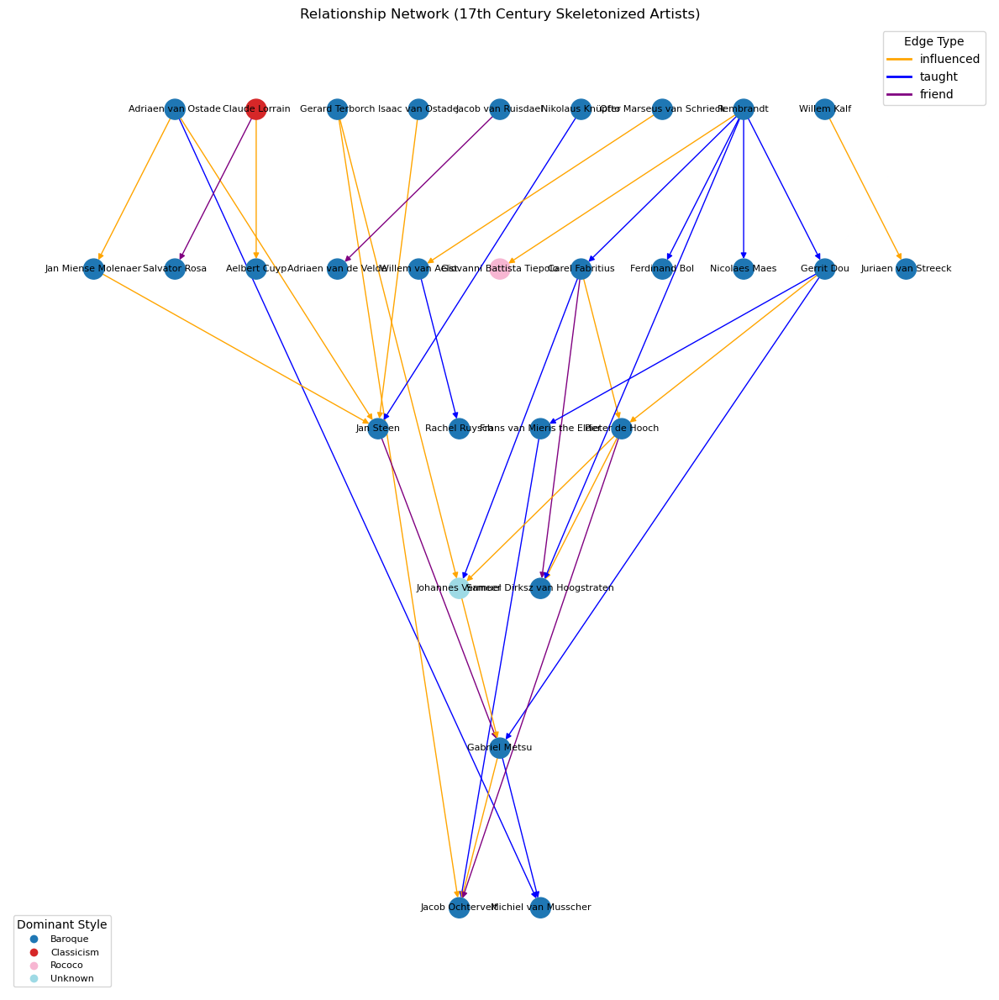

In [379]:
skeletonized_artist_relationships_17c = skeletonize_relationship_network(artist_relationships_17c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_17c, "17th Century Skeletonized")

Longest path in the DAG: 
Thomas Gainsborough --> John Constable (style: Romanticism) --> Théodore Géricault (style: Romanticism) --> Eugene Delacroix (style: Romanticism) --> Camille Corot (style: Realism)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


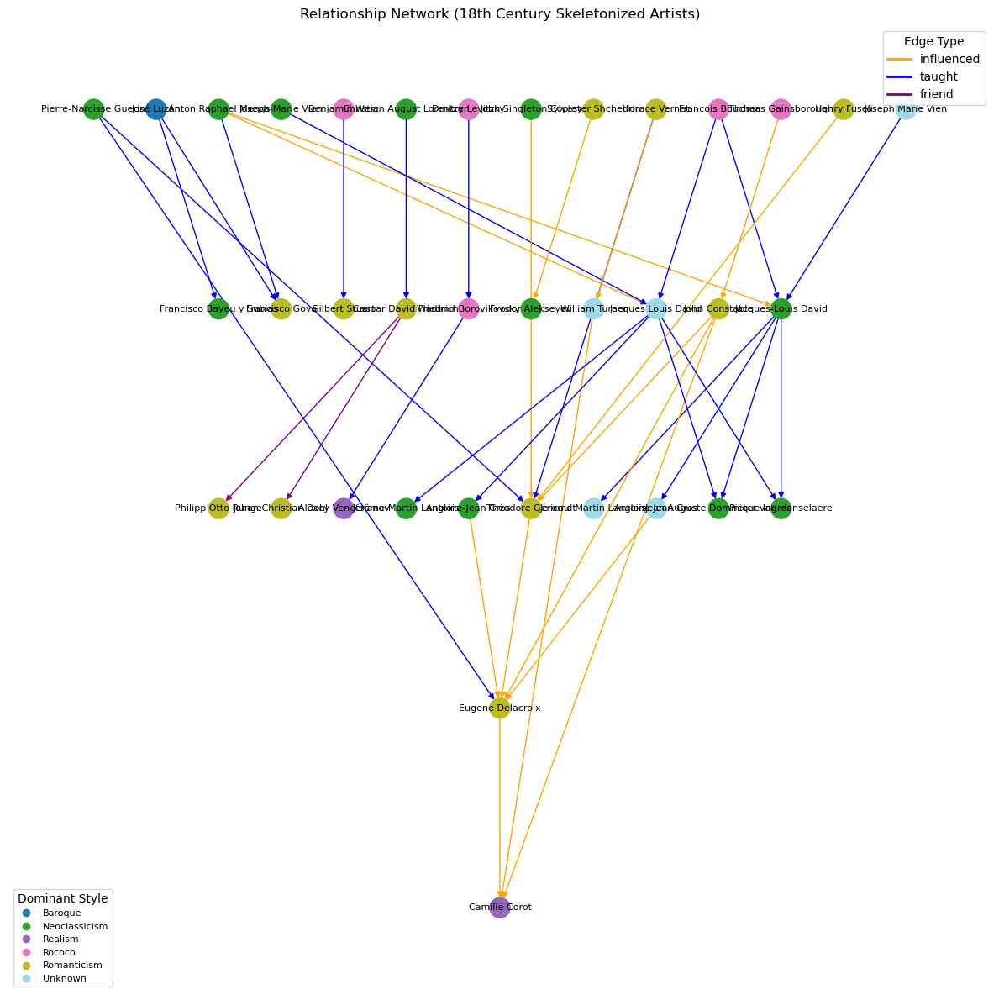

In [380]:
skeletonized_artist_relationships_18c = skeletonize_relationship_network(artist_relationships_18c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_18c, "18th Century Skeletonized")

Longest path in the DAG: 
Edouard Manet --> Henri Fantin Latour (style: Unknown) --> Carolus-Duran (style: Realism) --> Gustave Courbet (style: Realism) --> Charles-Francois Daubigny (style: Realism) --> Claude Monet (style: Impressionism) --> Pierre-Auguste Renoir (style: Impressionism) --> Frederic Bazille (style: Impressionism) --> Pierre Auguste Renoir (style: Unknown) --> Paul Cezanne (style: Post-Impressionism) --> Paul Gauguin (style: Post-Impressionism) --> Vincent van Gogh (style: Post-Impressionism) --> Edvard Munch (style: Expressionism) --> Henri Matisse (style: Expressionism) --> Pablo Picasso (style: Surrealism) --> Piet Mondrian (style: Neoplasticism) --> Fernand Leger (style: Cubism) --> Robert Delaunay (style: Unknown) --> Aristarkh Lentulov (style: Cubo-Futurism) --> Kazimir Malevich (style: Suprematism) --> Marc Chagall (style: Unknown) --> Diego Rivera (style: Muralism) --> Roberto Montenegro (style: Unknown) --> Saturnino Herran (style: Art Nouveau (Modern)) --> Ro

/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


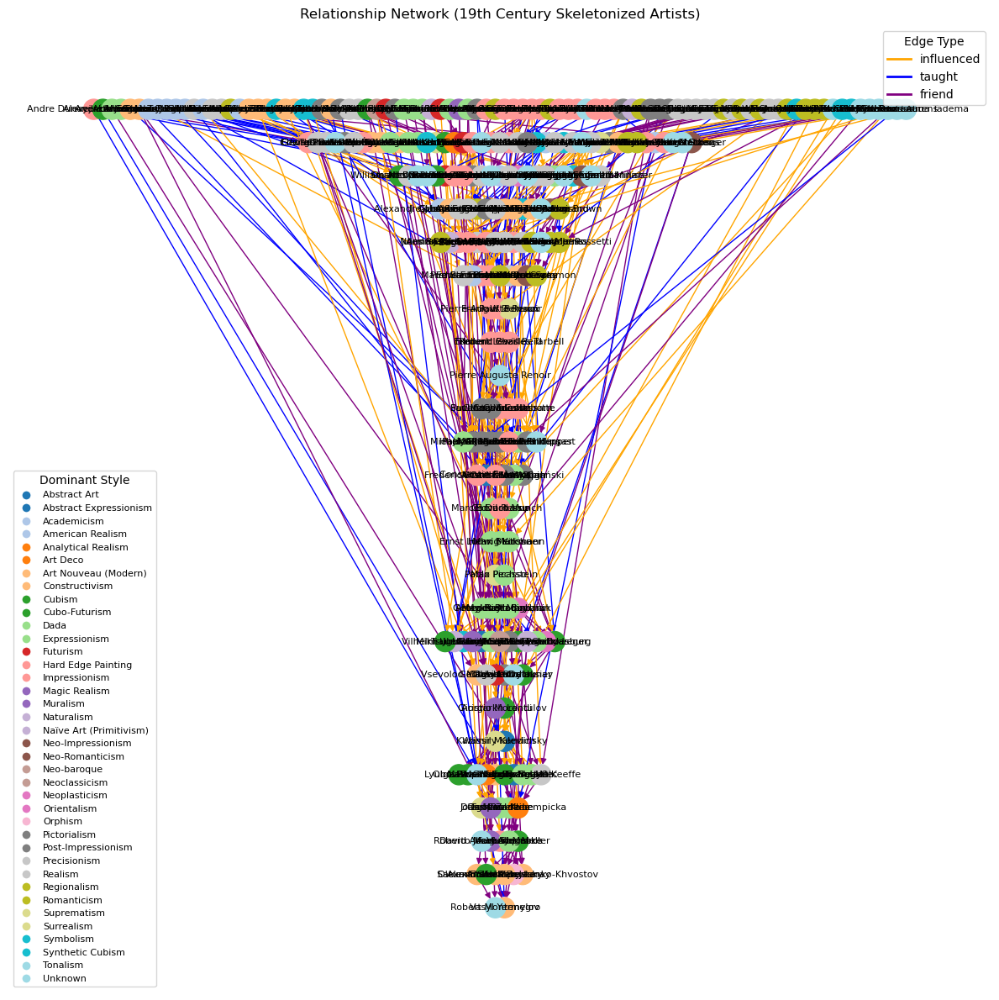

In [381]:
skeletonized_artist_relationships_19c = skeletonize_relationship_network(artist_relationships_19c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_19c, "19th Century Skeletonized")

Longest path in the DAG: 
Willem de Kooning --> Lee Krasner (style: Abstract Expressionism) --> Jackson Pollock (style: Action painting) --> Robert Motherwell (style: Abstract Expressionism) --> Cy Twombly (style: Abstract Expressionism) --> Jasper Johns (style: Pop Art) --> Andy Warhol (style: Pop Art) --> Gerhard Richter (style: New European Painting) --> Ellsworth Kelly (style: Hard Edge Painting) --> Richard Serra (style: Minimalism) --> Jessica Stockholder (style: Post-Minimalism)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


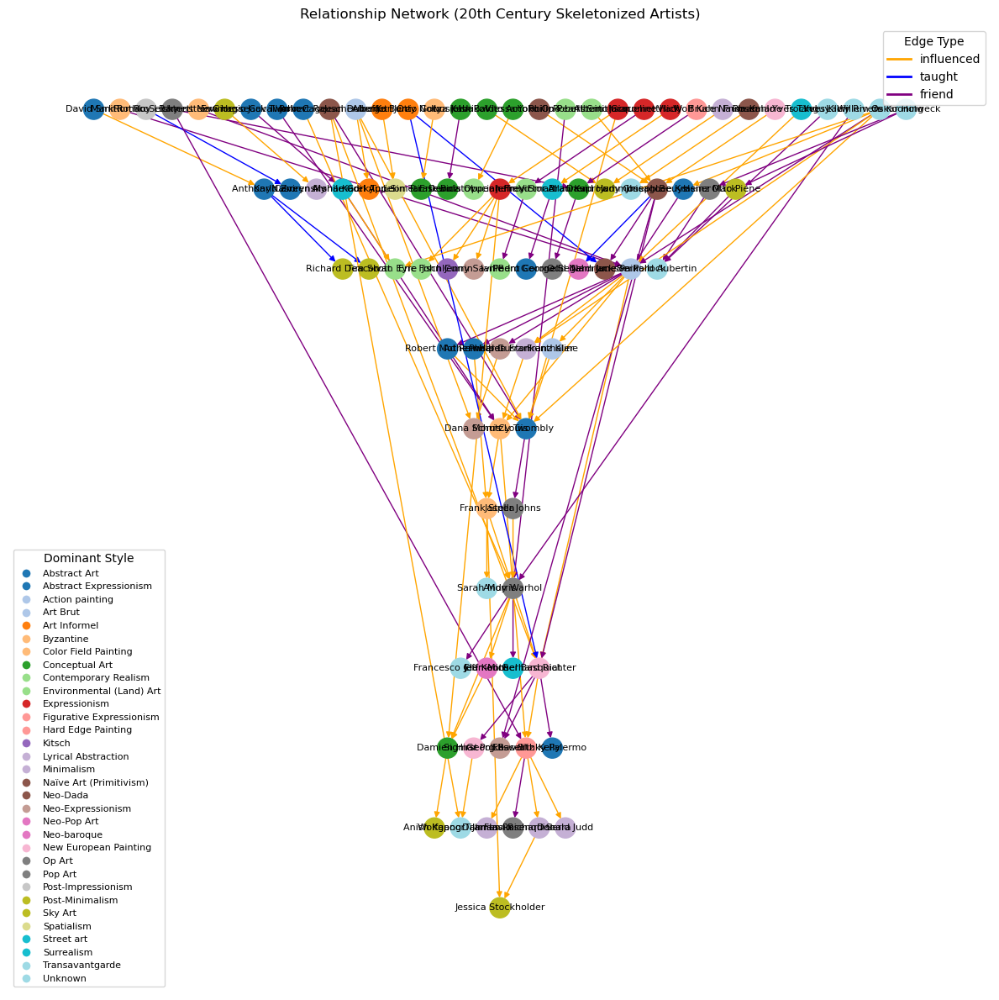

In [382]:
skeletonized_artist_relationships_20c = skeletonize_relationship_network(artist_relationships_20c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_20c, "20th Century Skeletonized")

In [383]:
# prepare to make visualization of window of 2 centuries at a time

# split the artists into the two-century block that they belong
artists_1415c = artists[(artists['birth_year'] >= 1300) & (artists['birth_year'] < 1500)]
artists_1516c = artists[(artists['birth_year'] >= 1400) & (artists['birth_year'] < 1600)]
artists_1617c = artists[(artists['birth_year'] >= 1500) & (artists['birth_year'] < 1700)]
artists_1718c = artists[(artists['birth_year'] >= 1600) & (artists['birth_year'] < 1800)]
artists_1819c = artists[(artists['birth_year'] >= 1700) & (artists['birth_year'] < 1900)]
artists_1920c = artists[(artists['birth_year'] >= 1800) & (artists['birth_year'] < 2000)]

POTENTIALLY INTERESTING CYCLES:
Mariotto Albertinelli --> Pietro Perugino --> Mariotto Albertinelli
Longest path in the DAG: 
Robert Campin --> Jan van Eyck (style: Northern Renaissance) --> Petrus Christus (style: Northern Renaissance) --> Hugo van der Goes (style: Northern Renaissance) --> Domenico Ghirlandaio (style: Early Renaissance) --> Michelangelo (style: High Renaissance) --> Raphael (style: High Renaissance) --> Titian (style: High Renaissance)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


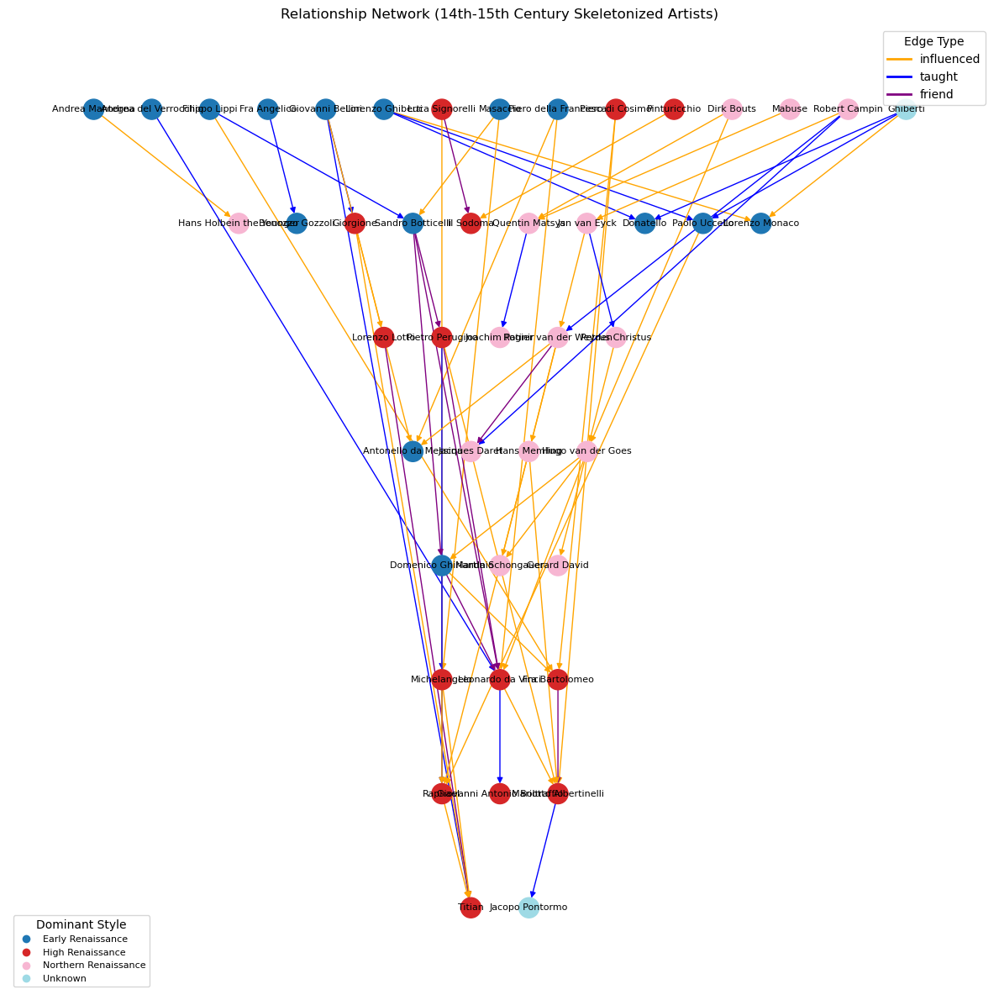

In [384]:
artist_relationships_1415c = artist_relationships(artists_1415c)
skeletonized_artist_relationships_1415c = skeletonize_relationship_network(artist_relationships_1415c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_1415c, "14th-15th Century Skeletonized")

POTENTIALLY INTERESTING CYCLES:
Adam van Noort --> Peter Paul Rubens --> Jacob Jordaens --> Adam van Noort
Adam van Noort --> Jacob Jordaens --> Adam van Noort
Mariotto Albertinelli --> Pietro Perugino --> Mariotto Albertinelli
Longest path in the DAG: 
Masaccio --> Sandro Botticelli (style: Early Renaissance) --> Domenico Ghirlandaio (style: Early Renaissance) --> Michelangelo (style: High Renaissance) --> Raphael (style: High Renaissance) --> Titian (style: High Renaissance) --> Caravaggio (style: Unknown) --> Peter Paul Rubens (style: Baroque) --> Anthony van Dyck (style: Baroque) --> Frans Hals (style: Baroque) --> Pieter Codde (style: Baroque) --> Willem Cornelisz Duyster (style: Baroque)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


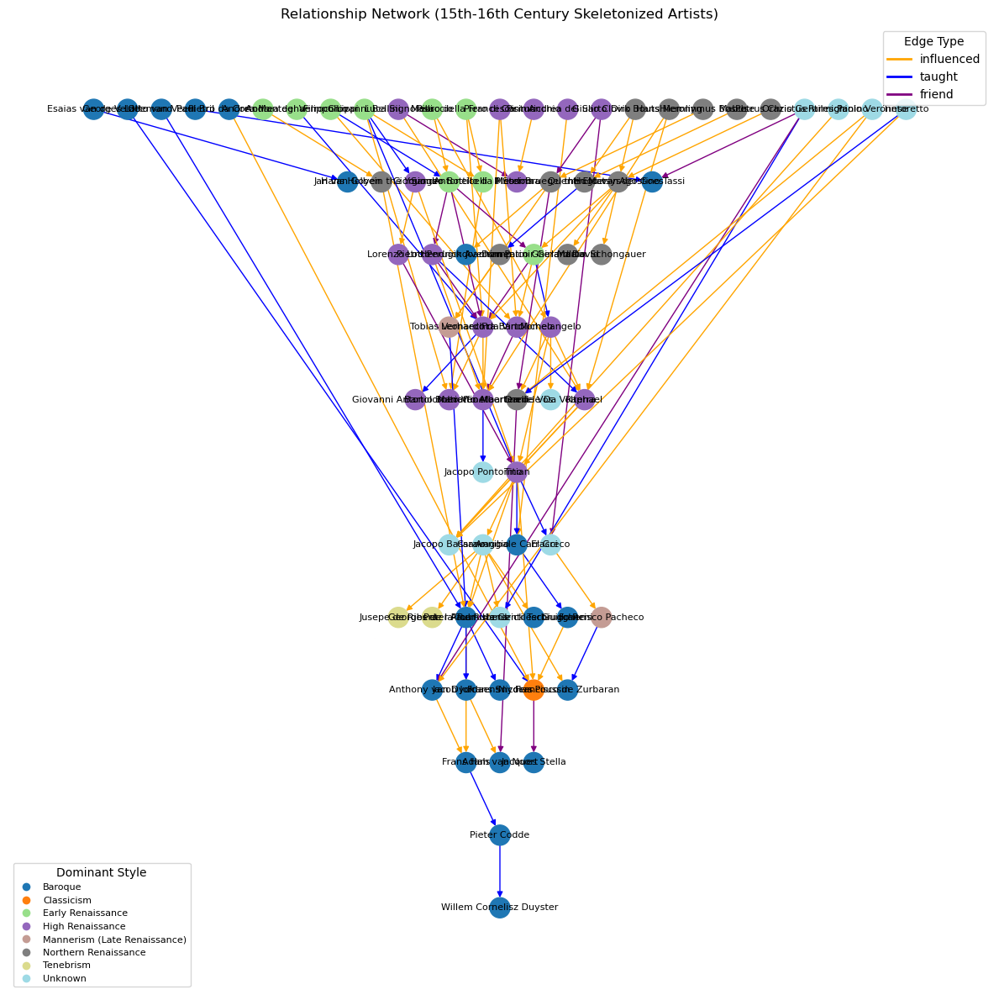

In [385]:
artist_relationships_1516c = artist_relationships(artists_1516c)
skeletonized_artist_relationships_1516c = skeletonize_relationship_network(artist_relationships_1516c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_1516c, "15th-16th Century Skeletonized")

POTENTIALLY INTERESTING CYCLES:
Adam van Noort --> Peter Paul Rubens --> Jacob Jordaens --> Adam van Noort
Adam van Noort --> Jacob Jordaens --> Adam van Noort
Salvator Rosa --> Gian Lorenzo Bernini --> Salvator Rosa
Longest path in the DAG: 
Pieter Bruegel the Elder --> Tobias Verhaecht (style: Mannerism (Late Renaissance)) --> Peter Paul Rubens (style: Baroque) --> Anthony van Dyck (style: Baroque) --> Frans Hals (style: Baroque) --> Pieter Codde (style: Baroque) --> Willem Cornelisz Duyster (style: Baroque) --> Gerard Terborch (style: Baroque) --> Johannes Vermeer (style: Unknown) --> Gabriel Metsu (style: Baroque) --> Jacob Ochtervelt (style: Baroque)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


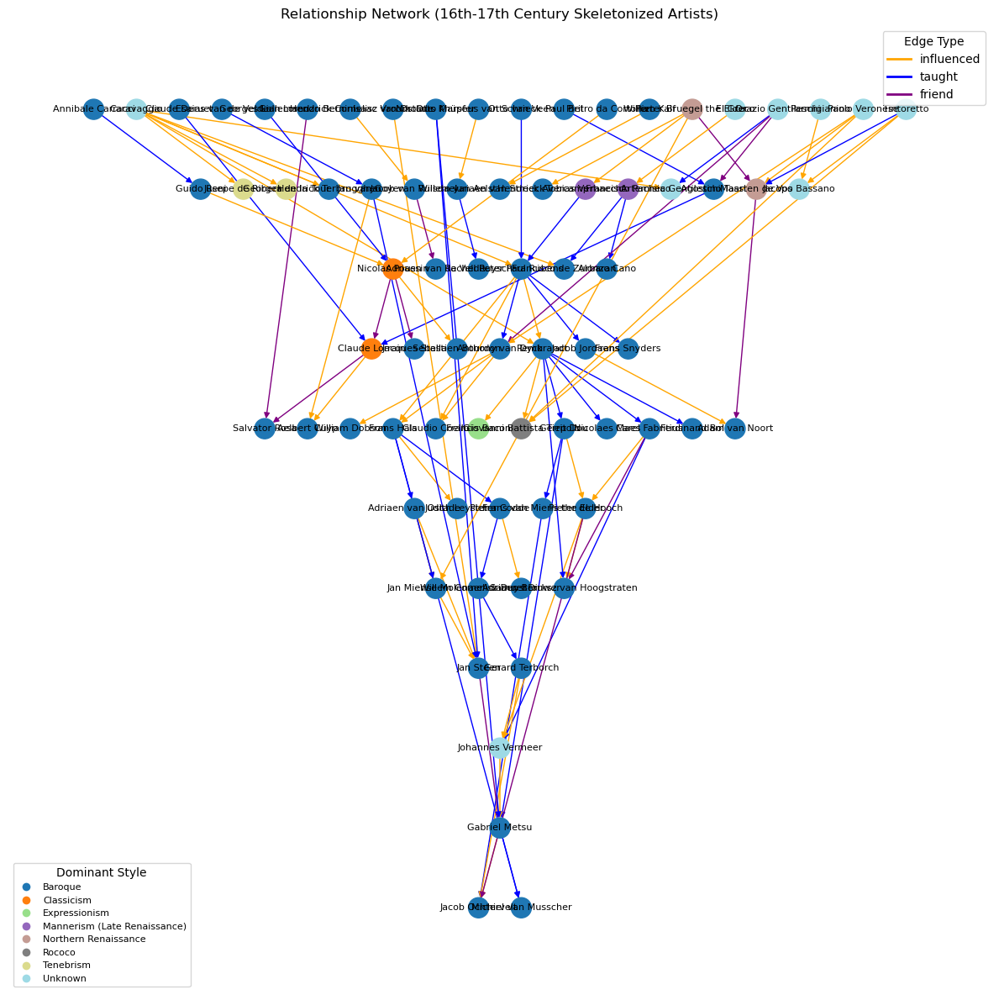

In [386]:
artist_relationships_1617c = artist_relationships(artists_1617c)
skeletonized_artist_relationships_1617c = skeletonize_relationship_network(artist_relationships_1617c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_1617c, "16th-17th Century Skeletonized")

POTENTIALLY INTERESTING CYCLES:
Canaletto --> Bernardo Bellotto --> Canaletto
Gilbert Stuart --> Benjamin West --> Gilbert Stuart
Fyodor Alekseyev --> Sylvester Shchedrin --> Fyodor Alekseyev
Longest path in the DAG: 
Rembrandt --> Gerrit Dou (style: Baroque) --> Pieter de Hooch (style: Baroque) --> Johannes Vermeer (style: Unknown) --> Gabriel Metsu (style: Baroque) --> Jacob Ochtervelt (style: Baroque)


/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


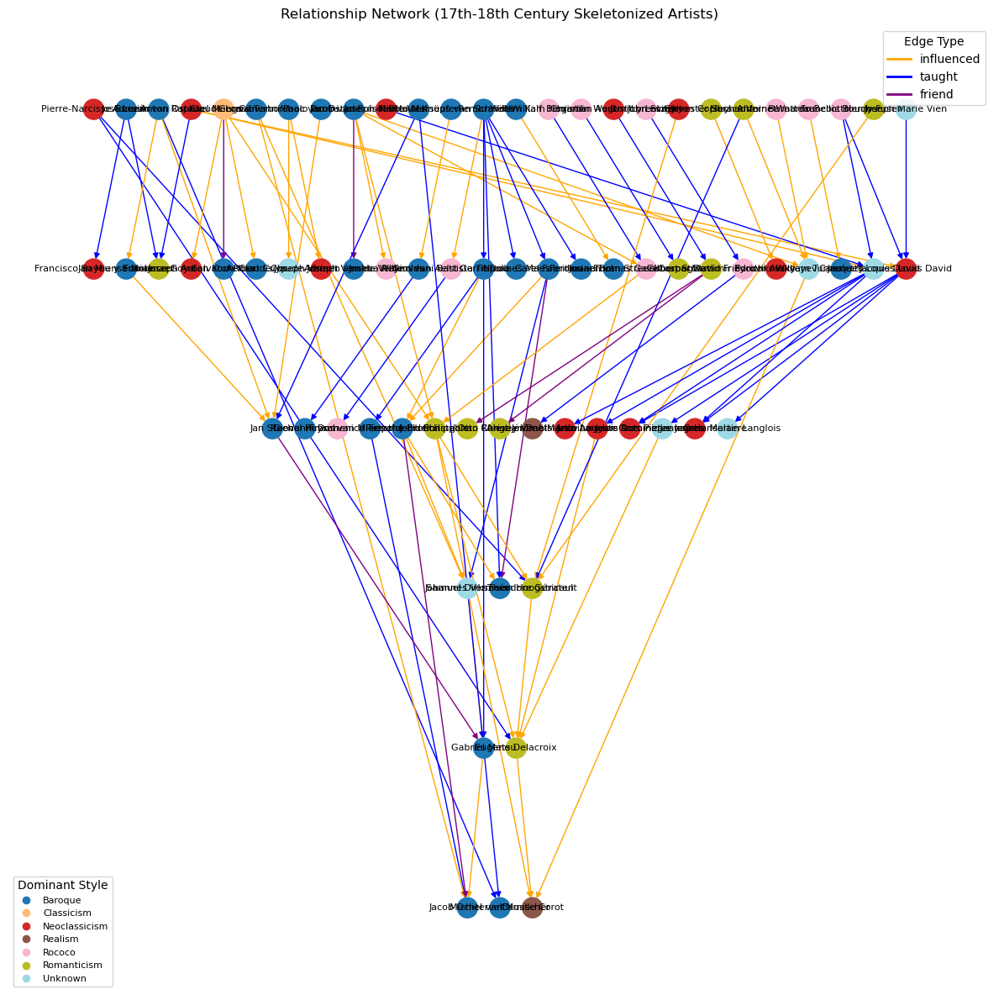

In [387]:
artist_relationships_1718c = artist_relationships(artists_1718c)
skeletonized_artist_relationships_1718c = skeletonize_relationship_network(artist_relationships_1718c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_1718c, "17th-18th Century Skeletonized")

POTENTIALLY INTERESTING CYCLES:
Edward Hopper --> Robert Henri --> Edward Hopper
Edward Hopper --> Rockwell Kent --> Edward Hopper
Alexander Khvostenko-Khvostov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Victor Palmov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Vladimir Tatlin --> Alexander Khvostenko-Khvostov
Frank W. Benson --> Willard Metcalf --> Frank W. Benson
William Adolphe Bouguereau --> Paul Émile Chabas --> William Adolphe Bouguereau
Alexandre-Jacques Chantron --> William Adolphe Bouguereau --> Alexandre-Jacques Chantron
David Alfaro Siqueiros --> Umberto Boccioni --> David Alfaro Siqueiros
Chaim Soutine --> Michel Kikoine --> Chaim Soutine
Marc Chagall --> Pablo Picasso --> Piet Mondrian --> Fernand Leger --> Constantin Brâncuși --> Amedeo Modigliani --> Chaim Soutine --> Marc Chagall
David Burliuk --> Victor Palmov --> David Burliuk
Vasyl Yermylov --> David Burliuk --> Vasyl Yermylov
Consta

/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


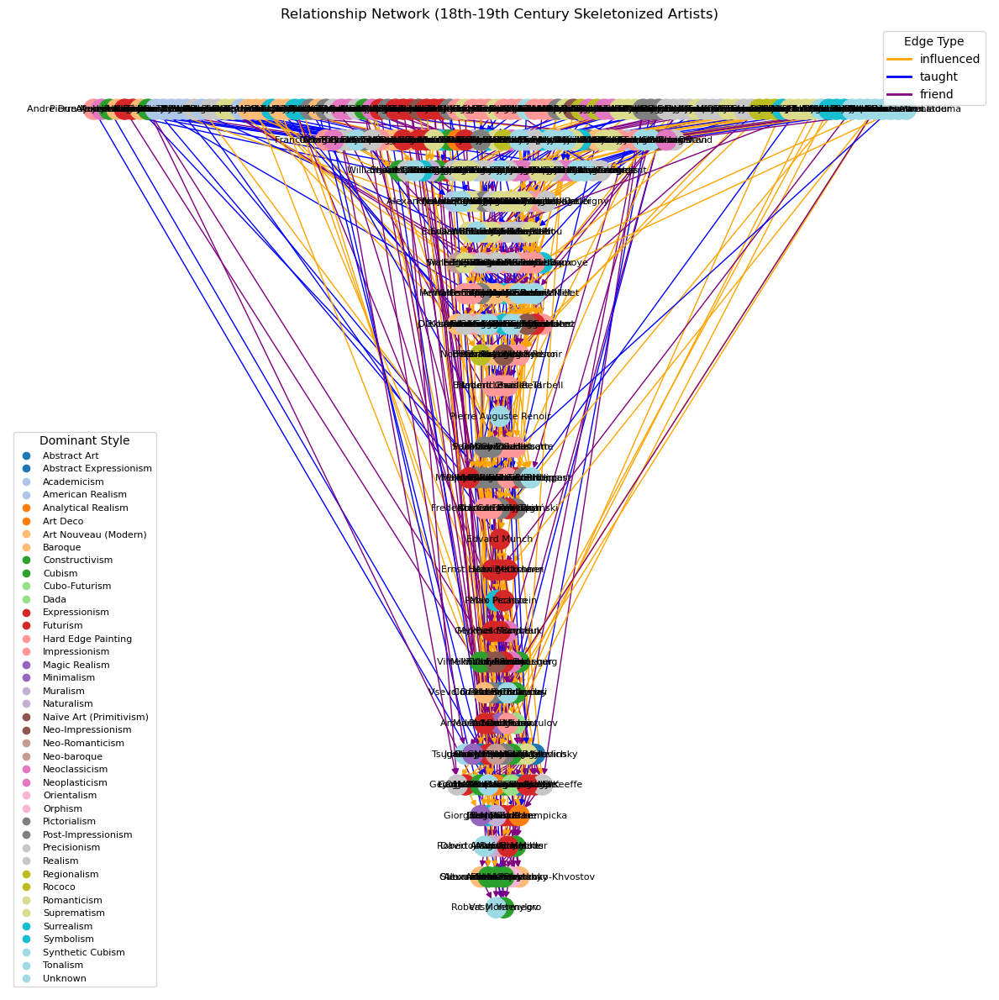

In [388]:
artist_relationships_1819c = artist_relationships(artists_1819c)
skeletonized_artist_relationships_1819c = skeletonize_relationship_network(artist_relationships_1819c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_1819c, "18th-19th Century Skeletonized")

POTENTIALLY INTERESTING CYCLES:
Sigmar Polke --> Joseph Beuys --> Sigmar Polke
Andy Warhol --> Marcel Duchamp --> Andy Warhol
Andy Warhol --> Jeff Koons --> Damien Hirst --> Marcel Duchamp --> Andy Warhol
Andy Warhol --> Damien Hirst --> Marcel Duchamp --> Andy Warhol
Jackson Pollock --> Lee Krasner --> Jackson Pollock
Mark Rothko --> Jackson Pollock --> Ad Reinhardt --> Mark Rothko
Edward Hopper --> Robert Henri --> Edward Hopper
Jackson Pollock --> Ad Reinhardt --> Barnett Newman --> Jackson Pollock
Edward Hopper --> Rockwell Kent --> Edward Hopper
Alexander Khvostenko-Khvostov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Victor Palmov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Vladimir Tatlin --> Alexander Khvostenko-Khvostov
Frank W. Benson --> Willard Metcalf --> Frank W. Benson
William Adolphe Bouguereau --> Paul Émile Chabas --> William Adolphe Bouguereau
Alexandre-Jacques Chantron --> William Ad

/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


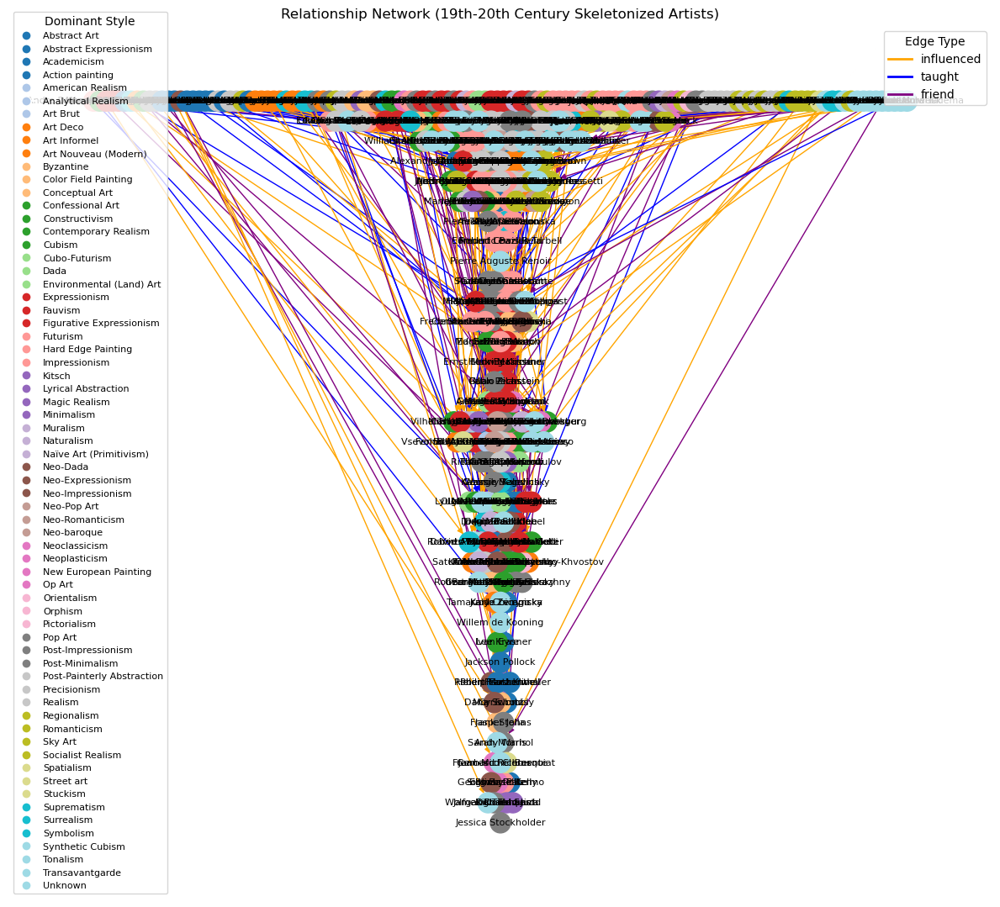

In [389]:
artist_relationships_1920c = artist_relationships(artists_1920c)
skeletonized_artist_relationships_1920c = skeletonize_relationship_network(artist_relationships_1920c)
visualize_skeletonized_relationships(skeletonized_artist_relationships_1920c, "19th-20th Century Skeletonized")

POTENTIALLY INTERESTING CYCLES:
Mark Rothko --> Caspar David Friedrich --> Mark Rothko
Mark Rothko --> Jackson Pollock --> Lee Krasner --> Jasper Johns --> Andy Warhol --> Gerhard Richter --> Caspar David Friedrich --> Mark Rothko
Edward Hopper --> Robert Henri --> Edward Hopper
Gerhard Richter --> Caspar David Friedrich --> Gerhard Richter
Sigmar Polke --> Joseph Beuys --> Sigmar Polke
Andy Warhol --> Marcel Duchamp --> Andy Warhol
Andy Warhol --> Jeff Koons --> Damien Hirst --> Marcel Duchamp --> Andy Warhol
Andy Warhol --> Damien Hirst --> Marcel Duchamp --> Andy Warhol
Lee Krasner --> Jackson Pollock --> Lee Krasner
Jackson Pollock --> Ad Reinhardt --> Barnett Newman --> Jackson Pollock
Edward Hopper --> Rockwell Kent --> Edward Hopper
Alexander Khvostenko-Khvostov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Victor Palmov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Vladimir Tatlin --> Alexander Khvo

/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('tab20', len(styles))
/var/folders/cp/rbkmkhzs19qbp231mq4ct6lw0000gn/T/ipykernel_96061/3311258767.py:63: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(G, pos, edge_color=edge_colors)


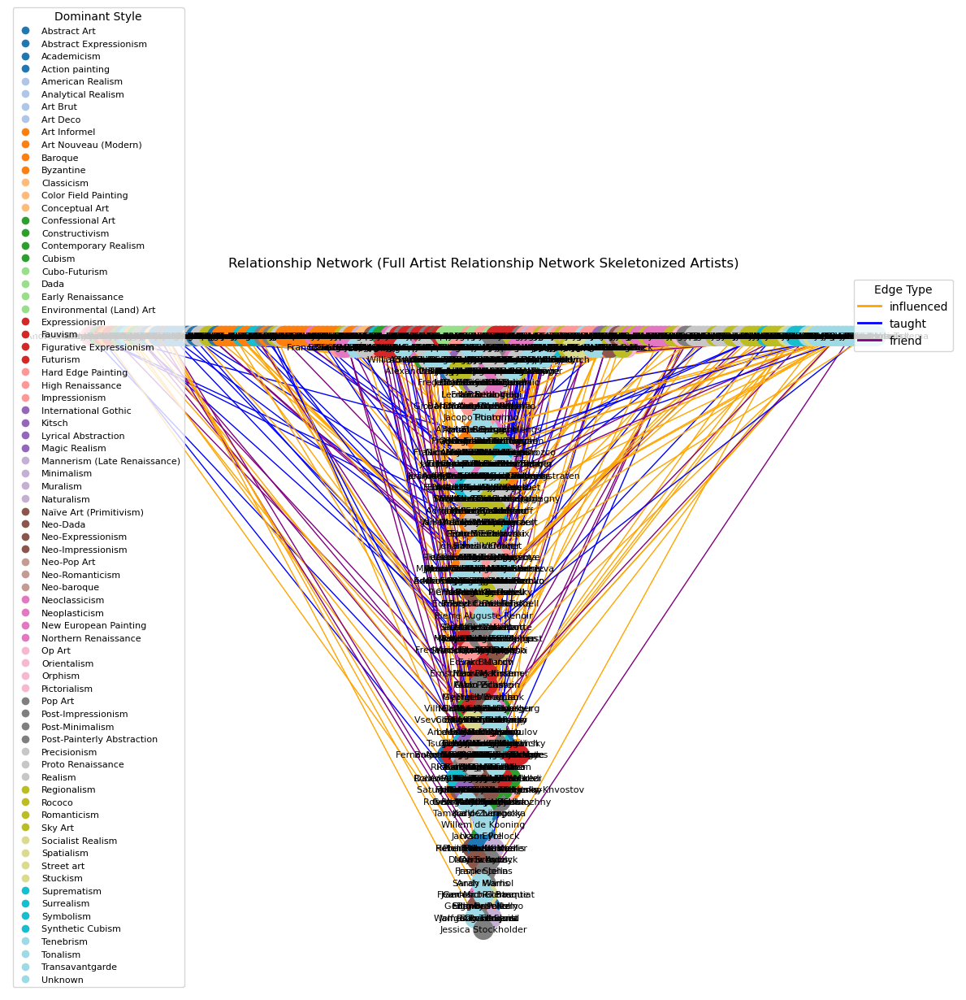

In [390]:
artist_relationships_full = artist_relationships(artists)
skeletonized_artist_relationships_full = skeletonize_relationship_network(artist_relationships_full)
visualize_skeletonized_relationships(skeletonized_artist_relationships_full, "Full Artist Relationship Network Skeletonized")

In [391]:
# calculate intersection over union measure for all pairs of networks (4 x 4 matrix for each century)
# notably, remove nodes that don't have edges in both graphs
def intersection_over_union(G1, G2):
    G1copy = G1.copy()
    G2copy = G2.copy()
    # remove nodes that don't have edges in both graphs
    for node in list(G1copy.nodes()):
        if G1copy.degree(node) == 0 or G2copy.degree(node) == 0:
            if node in G1copy:
                G1copy.remove_node(node)
            if node in G2copy:
                G2copy.remove_node(node)
    edges_G1 = set(G1copy.edges())
    edges_G2 = set(G2copy.edges())
    intersection = edges_G1.intersection(edges_G2)
    union = edges_G1.union(edges_G2)
    if len(union) == 0:
        return 0
    return len(intersection) / len(union)

In [392]:
# for each century, calculate intersection over union for each pair of networks (geo proximity, style sharing, exhibition sharing, relationships)
# note: will use NON-skeletonized relationship network
def calculate_iou_matrix(geo_G, style_G, exhibition_G, relationship_G):
    # duplicate all edges in relationship_G to make it undirected for better comparison with other networks
    relationship_G_undirected = nx.Graph()
    relationship_G_undirected.add_nodes_from(relationship_G.nodes())
    for u, v, data in relationship_G.edges(data=True):
        relationship_G_undirected.add_edge(u, v)
    networks = [geo_G, style_G, exhibition_G, relationship_G_undirected]
    iou_matrix = [[0 for _ in range(len(networks))] for _ in range(len(networks))]
    for i in range(len(networks)):
        for j in range(len(networks)):
            iou_matrix[i][j] = intersection_over_union(networks[i], networks[j])
    return iou_matrix

In [393]:
def visualize_iou_matrix(iou_matrix, tag):
    data = np.array(iou_matrix, dtype=float)

    fig, ax = plt.subplots(figsize=(8, 6))
    im = ax.imshow(data, cmap='Blues')

    labels = ['Geo Proximity', 'Style Sharing', 'Exhibition Sharing', 'Relationships']
    ax.set_xticks(np.arange(len(labels)))
    ax.set_yticks(np.arange(len(labels)))
    ax.set_xticklabels(labels)
    ax.set_yticklabels(labels)

    # rotate x labels
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # annotate each cell
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            ax.text(j, i, f"{data[i, j]:.2f}",
                    ha="center", va="center", color="black")

    ax.set_title(f'Intersection Over Union Matrix ({tag} Artists)')
    fig.colorbar(im)

    plt.tight_layout()
    plt.savefig('iou_heatmap.png', bbox_inches='tight')
    plt.show()

POTENTIALLY INTERESTING CYCLES:


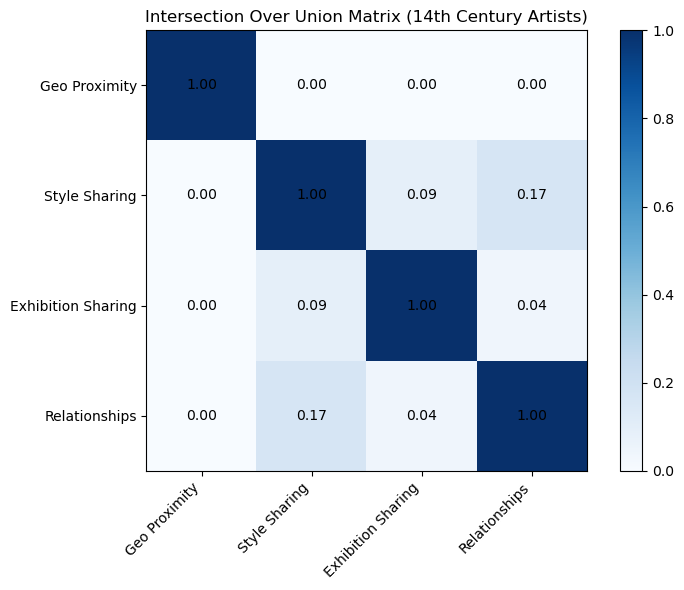

In [394]:
iou_matrix_14c = calculate_iou_matrix(geo_proximity(artists_14c), style_share(artists_14c), shared_exhibitions(artists_14c), artist_relationships(artists_14c))
# print("IOU Matrix for 14th Century Artists:")
# print(iou_matrix_14c)
visualize_iou_matrix(iou_matrix_14c, "14th Century")

POTENTIALLY INTERESTING CYCLES:
Mariotto Albertinelli --> Pietro Perugino --> Mariotto Albertinelli


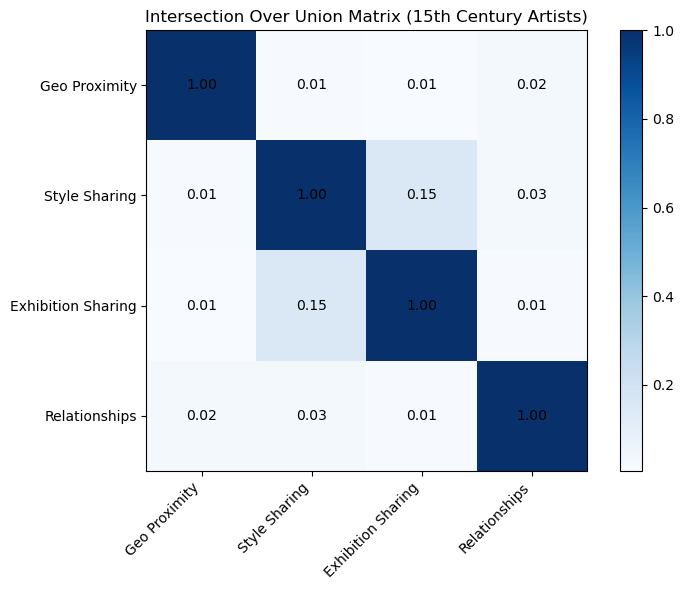

In [395]:
iou_matrix_15c = calculate_iou_matrix(geo_proximity(artists_15c), style_share(artists_15c), shared_exhibitions(artists_15c), artist_relationships(artists_15c))
visualize_iou_matrix(iou_matrix_15c, "15th Century")

POTENTIALLY INTERESTING CYCLES:
Adam van Noort --> Peter Paul Rubens --> Jacob Jordaens --> Adam van Noort
Adam van Noort --> Jacob Jordaens --> Adam van Noort


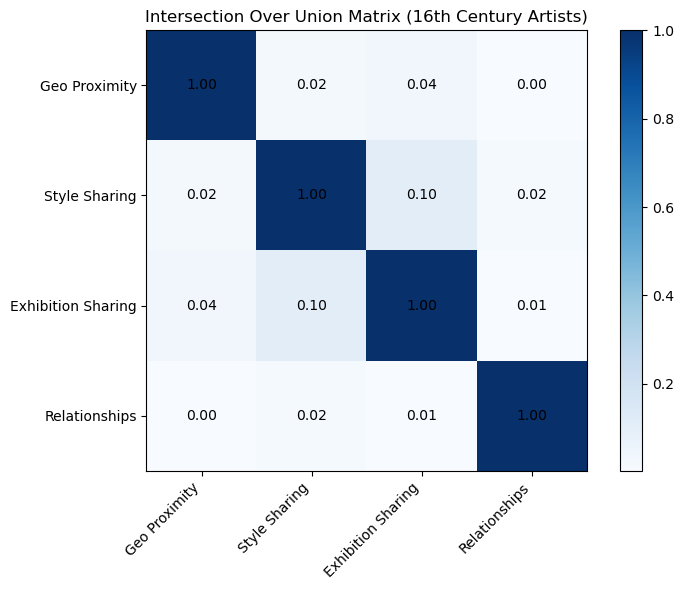

In [396]:
iou_matrix_16c = calculate_iou_matrix(geo_proximity(artists_16c), style_share(artists_16c), shared_exhibitions(artists_16c), artist_relationships(artists_16c))
visualize_iou_matrix(iou_matrix_16c, "16th Century")

POTENTIALLY INTERESTING CYCLES:


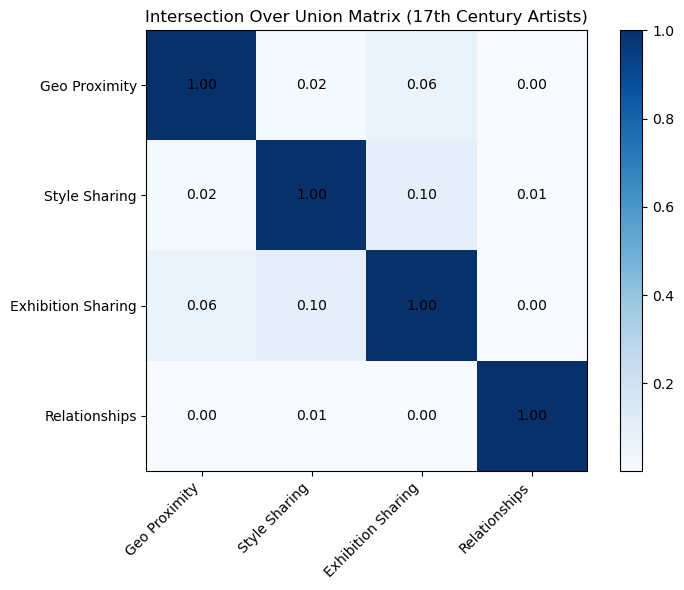

In [397]:
iou_matrix_17c = calculate_iou_matrix(geo_proximity(artists_17c), style_share(artists_17c), shared_exhibitions(artists_17c), artist_relationships(artists_17c))
visualize_iou_matrix(iou_matrix_17c, "17th Century")

POTENTIALLY INTERESTING CYCLES:
Gilbert Stuart --> Benjamin West --> Gilbert Stuart
Fyodor Alekseyev --> Sylvester Shchedrin --> Fyodor Alekseyev


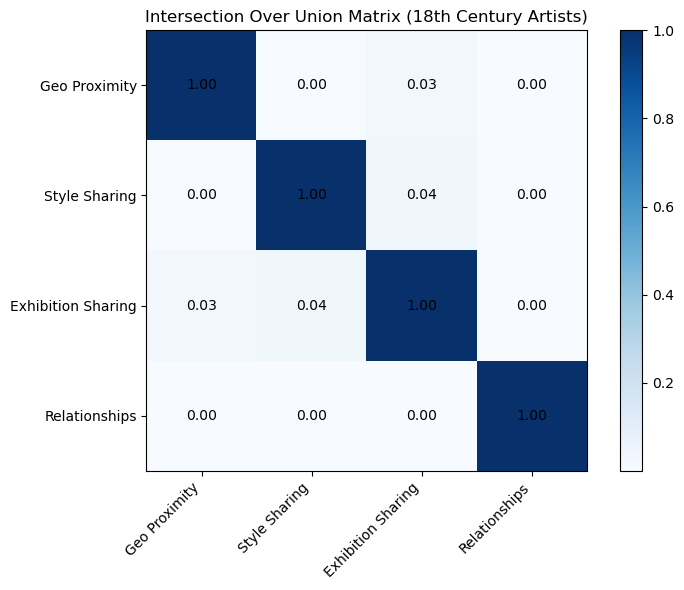

In [398]:
iou_matrix_18c = calculate_iou_matrix(geo_proximity(artists_18c), style_share(artists_18c), shared_exhibitions(artists_18c), artist_relationships(artists_18c))
visualize_iou_matrix(iou_matrix_18c, "18th Century")

POTENTIALLY INTERESTING CYCLES:
Edward Hopper --> Robert Henri --> Edward Hopper
Edward Hopper --> Rockwell Kent --> Edward Hopper
Alexander Khvostenko-Khvostov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Victor Palmov --> David Burliuk --> Alexander Khvostenko-Khvostov
Alexander Khvostenko-Khvostov --> Vladimir Tatlin --> Alexander Khvostenko-Khvostov
Frank W. Benson --> Willard Metcalf --> Frank W. Benson
William Adolphe Bouguereau --> Paul Émile Chabas --> William Adolphe Bouguereau
Alexandre-Jacques Chantron --> William Adolphe Bouguereau --> Alexandre-Jacques Chantron
David Alfaro Siqueiros --> Umberto Boccioni --> David Alfaro Siqueiros
Chaim Soutine --> Michel Kikoine --> Chaim Soutine
Marc Chagall --> Pablo Picasso --> Piet Mondrian --> Fernand Leger --> Constantin Brâncuși --> Amedeo Modigliani --> Chaim Soutine --> Marc Chagall
David Burliuk --> Victor Palmov --> David Burliuk
Vasyl Yermylov --> David Burliuk --> Vasyl Yermylov
Fernan

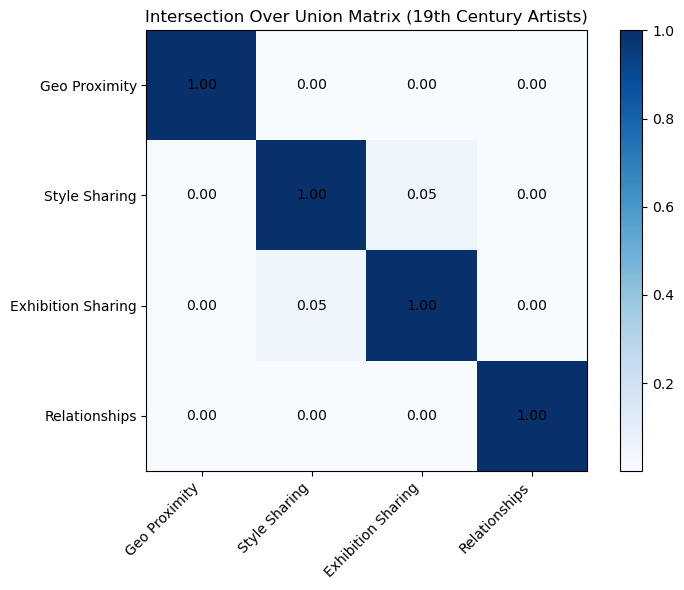

In [399]:
iou_matrix_19c = calculate_iou_matrix(geo_proximity(artists_19c), style_share(artists_19c), shared_exhibitions(artists_19c), artist_relationships(artists_19c))
visualize_iou_matrix(iou_matrix_19c, "19th Century")

POTENTIALLY INTERESTING CYCLES:
Sigmar Polke --> Joseph Beuys --> Sigmar Polke
Jackson Pollock --> Lee Krasner --> Jackson Pollock
Ad Reinhardt --> Mark Rothko --> Jackson Pollock --> Ad Reinhardt
Ad Reinhardt --> Barnett Newman --> Jackson Pollock --> Ad Reinhardt
Erik Bulatov --> Ilya Kabakov --> Erik Bulatov
Allan Kaprow --> Wolf Kahn --> Allan Kaprow
Arshile Gorky --> Giorgio Cavallon --> Arshile Gorky
Dennis Oppenheim --> Vito Acconci --> Dennis Oppenheim
Joseph Beuys --> Yoko Ono --> Joseph Beuys
Joseph Beuys --> Robert Smithson --> Joseph Beuys
Joseph Beuys --> Rosemarie Trockel --> Joseph Beuys
Victor Brauner --> Vlady --> Victor Brauner


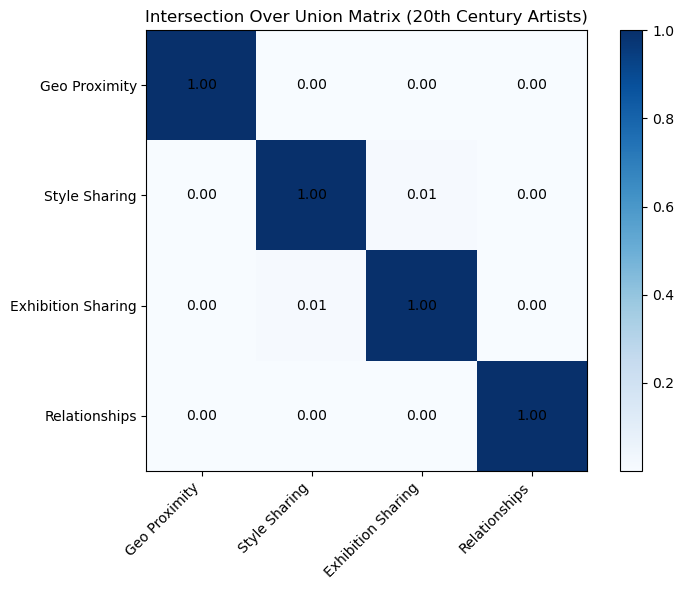

In [400]:
iou_matrix_20c = calculate_iou_matrix(geo_proximity(artists_20c), style_share(artists_20c), shared_exhibitions(artists_20c), artist_relationships(artists_20c))
visualize_iou_matrix(iou_matrix_20c, "20th Century")

In [401]:
# complementary graphs (nodes = location/style/exhibition, edges = artists)

In [402]:
# presentation (recommended 5 slides, 4 visuals, pick earlier and later centuries to show, and list potential questions)

# potential questions:
# which artist was central / quite influential?
# can we construct directed links between the categories derived from the directed artist influence graph and the complementary graphs?
# analyze gender


# m: complementary graphs
# r: 
# t: look into Barabasi art network project, help m with pushing to github